# **NGSIM Traffic Dataset Definition**

---




*ID; Definition; Type*


---




Vehicle_ID (Column A); Vehicle identification number (ascending by time of entry into section); Integer 

Frame_ID (Column B); Frame Identification number (ascending by start time); Integer 
 
Total_Frames (Column C); Total number of frames in which the vehicle appears in this data set; Integer

Global_Time (Column D); Elapsed time in milliseconds since Jan 1, 1970; Integer 

Local_X (Column E); Lateral (X) coordinate of the front center of the vehicle in feet with respect to the left-most edge of the section in the direction of travel; Double 

Local_Y (Column F); Longitudinal (Y) coordinate of the front center of the vehicle in feet with respect to the entry edge of the section in the direction of travel; Double 

Global_X (Column G); X Coordinate of the front center of the vehicle in feet based on CA State Plane III in NAD83; Double 

Global_Y (Column H); Y Coordinate of the front center of the vehicle in feet based on CA State Plane III in NAD83; Double 

v_Length (Column I); Length of vehicle in feet; Double 

v_Width (Column J); Width of vehicle in feet; Double 

v_Class (Column K); Vehicle type: 1 - motorcycle, 2 - auto, 3 - truck; Integer 

v_Vel (Column L); Instantaneous velocity of vehicle in feet/second; Double 

v_Acc (Column M); Instantaneous acceleration of vehicle in feet/second square; Double 

Lane_ID (Column N); Current lane position of vehicle. Lane 1 is farthest left lane; lane 5 is farthest right lane. Lane 6 is the auxiliary lane between Ventura Boulevard on-ramp and the Cahuenga Boulevard off-ramp. Lane 7 is the on-ramp at Ventura Boulevard, and Lane 8 is the off-ramp at Cahuenga Boulevard; Integer 

Preceding (Column O); Vehicle ID of the lead vehicle in the same lane. A value of '0' represents no preceding vehicle - occurs at the end of the study section and off-ramp due to the fact that only complete trajectories were recorded by this data collection effort (vehicles already in the section at the start of the study period were not recorded); Integer 

Following (Column P); Vehicle ID of the vehicle following the subject vehicle in the same lane. A value of '0' represents no following vehicle - occurs at the beginning of the study section and onramp due to the fact that only complete trajectories were recorded by this data collection effort (vehicle that did not traverse the downstream boundaries of the section by the end of the study period were not recorded); Integer 

Space_Headway (Column Q); Space Headway in feet. Spacing provides the distance between the frontcenter of a vehicle to the front-center of the preceding vehicle; Double 

Time_Headway (Column R); Time Headway in seconds. Time Headway provides the time to travel from the front-center of a vehicle (at the speed of the vehicle) to the front-center of the preceding vehicle. A headway value of 9999.99 means that the vehicle is traveling at zero speed (congested conditions); Double

# Data Import and Preprocessing

---




In [1]:
from google.colab import drive
import pandas as pd
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
import random
import numpy as np
from scipy import signal
import numpy as np
import numexpr
import matplotlib.pyplot as plt
drive.mount('/content/drive')
Path = 'drive/MyDrive/Traffic_data'

Mounted at /content/drive


In [2]:
df = pd.read_csv(Path+'/Next_Generation_Simulation__NGSIM__Vehicle_Trajectories_and_Supporting_Data.csv')
print(type(df))
df.head(5)

<class 'pandas.core.frame.DataFrame'>


,Vehicle_ID,Frame_ID,Total_Frames,Global_Time,Local_X,Local_Y,Global_X,Global_Y,v_length,v_Width,v_Class,v_Vel,v_Acc,Lane_ID,O_Zone,D_Zone,Int_ID,Section_ID,Direction,Movement,Preceding,Following,Space_Headway,Time_Headway,Location
0,515,2330,1123,1118848075000,30.034,188.062,6451203.729,1873252.549,13.0,6.9,2,23.31,2.05,3,NaN,NaN,NaN,NaN,NaN,NaN,500,523,119.10,5.11,us-101
1,515,2330,1123,1118848075000,30.034,188.062,6451203.729,1873252.549,13.0,6.9,2,23.31,2.05,3,NaN,NaN,NaN,NaN,NaN,NaN,500,523,119.10,5.11,us-101
2,2224,6548,1902,1113437421700,41.429,472.901,6042814.264,2133542.012,14.3,6.9,2,26.54,-0.76,4,NaN,NaN,NaN,NaN,NaN,NaN,2208,2211,53.34,2.01,i-80
3,2127,6459,567,1118847624800,19.632,1775.614,6452425.122,1872172.475,13.5,6.9,2,37.52,11.20,2,NaN,NaN,NaN,NaN,NaN,NaN,2124,2132,48.92,1.30,us-101
4,1033,4827,592,1118848324700,6.202,1701.144,6452347.673,1872258.452,13.5,4.4,2,41.99,0.10,1,NaN,NaN,NaN,NaN,NaN,NaN,1029,1040,38.81,0.92,us-101


In [3]:
import datetime
def epoch_to_datetime(epoch):
  epochtime = int((epoch-25200000)/1000) #convert to GMT -7 Local Time Zone
  res = datetime.datetime.fromtimestamp(epochtime)
  return(res)

In [4]:
# regroup by location
group_by_loc = df[df["Location"] == "us-101"] ##us-101, i-80, lankershim, peachtree 
# regroup by Vehicle_ID
group_by_loc_id = group_by_loc.groupby('Vehicle_ID')
# check which vehicle has the most occurance (more data points)
print("For all 3 time domains, the Top 10 vehicles of most appearances: ")
print(group_by_loc_id.size().sort_values(ascending=False).head(5))

For all 3 time domains, the Top 10 vehicles of most appearances: 
Vehicle_ID
507    3719
562    3690
578    3655
874    3654
475    3628
dtype: int64


In [5]:
# taking only the congested traffic period
group_by_loc = group_by_loc[group_by_loc["Lane_ID"] <= 5] #do not include off-ramp
test_uncongested = group_by_loc[group_by_loc["Global_Time"] <= 1118847900000] 
test_transition = group_by_loc[group_by_loc["Global_Time"] >= 1118847900000]
test_transition = test_transition[test_transition["Global_Time"] <= 1118848800000]
test_congested = group_by_loc[group_by_loc["Global_Time"] >= 1118848800000] #after Jun,15,2005,8:20 AM
test_ifvalid = test_congested.groupby('Vehicle_ID')
# check which vehicle has the most occurance (more data points)
print("For congested time domain, the Top 10 vehicles of most appearances: ")
print(test_ifvalid["Vehicle_ID"].count().sort_values(ascending=False).head(5))

For congested time domain, the Top 10 vehicles of most appearances: 
Vehicle_ID
1239    1328
1234    1295
1272    1268
1253    1264
1192    1261
Name: Vehicle_ID, dtype: int64


In [6]:
print("Check for the largest vehicle ID number: ")
print(group_by_loc.sort_values(by=['Vehicle_ID'],ascending=False).head(5))

Check for the largest vehicle ID number: 
         Vehicle_ID  Frame_ID  ...  Time_Headway  Location
1321435        3109      7129  ...          2.50    us-101
2753140        3109      6907  ...          2.28    us-101
6615666        3109      7010  ...          2.83    us-101
4995772        3109      7024  ...          2.68    us-101
3853306        3109      6896  ...          2.40    us-101

[5 rows x 25 columns]


# Raw Data Visualization

---



Ego vehicle ID: No.  999
         Frame_ID    Global_Time  Local_X  ...  Lane_ID  Preceding  Following
6231365      5500  1118849307000   18.887  ...        2          0       1003
7679818      5501  1118849307100   18.884  ...        2          0       1003
7895935      5502  1118849307200   18.881  ...        2          0       1003
7638461      5503  1118849307300   18.877  ...        2          0       1003
945847       5504  1118849307400   18.874  ...        2          0       1003

[5 rows x 11 columns]


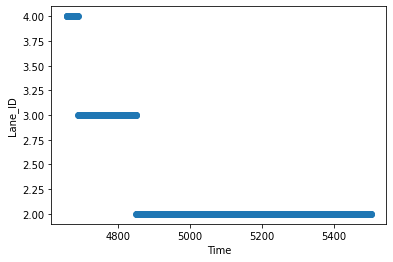

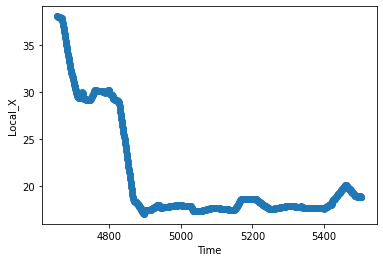

In [ ]:
# get no.999 vehicle 
ego_ID = 999
test_raw = test_congested[test_congested["Vehicle_ID"] == ego_ID]
# filter out attributes that are not of our interest
test_unsort = test_raw[["Frame_ID", "Global_Time","Local_X","Local_Y","Global_X","Global_Y","v_Class", "v_Vel", "Lane_ID", "Preceding", "Following"]]
# sort by time 
test = test_unsort.sort_values(by=['Global_Time'])
print("Ego vehicle ID: No. ", str(ego_ID))
print(test.tail(5))
# plot x, y  and timeframe to show trajectory
time_frame = test['Frame_ID']
test_globalX = test['Global_X']
test_globalY = test['Global_Y']
test_localX = test['Local_X']
test_localY = test['Local_Y']
test_laneID = test['Lane_ID']

plt.figure(1)
plt.scatter(time_frame[:], test_laneID[:])
plt.xlabel("Time")
plt.ylabel("Lane_ID")

plt.figure(2)
plt.scatter(time_frame[:], test_localX[:])
plt.xlabel("Time")
plt.ylabel("Local_X")

plt.show()

# Data Smoothing

---

In [ ]:
# smoothen data
smoothed = {}
def smoothen(data, id, smoothed):
  if id in smoothed.keys():
    return smoothed.get(id)

  data = data[data["Vehicle_ID"] == id]
  data = data.sort_values(by=['Global_Time'])

  loc_x = data[["Local_X"]].to_numpy()
  loc_y = data[["Local_Y"]].to_numpy()
  vel = data[["v_Vel"]].to_numpy()

  length = len(loc_x)

  if not length > 20:
    return data
  else:
    window = 2*(int(length/20))+17


  if window > 5:
    polyorder = 5
  elif window > 4:
    polyorder = 4
  elif window > 3:
    polyorder = 3
  elif window > 2:
    polyorder = 2
  else:
    polyorder = 1

  smoothed_x_values = signal.savgol_filter(np.ravel(loc_x), window, polyorder)
  smoothed_y_values = signal.savgol_filter(np.ravel(loc_y), window, polyorder)
  smoothed_v_values = signal.savgol_filter(np.ravel(vel), window, polyorder)

  #plot trajectory of vehicles of our interest
  plt.figure(5,figsize=(50,20))
  plt.plot(range(len(loc_x)), loc_x[:])
  plt.figure(6,figsize=(50,20))
  plt.plot(range(len(smoothed_x_values)), smoothed_x_values[:])

  pd_x = pd.DataFrame(smoothed_x_values, columns = ['Local_X'])
  pd_y = pd.DataFrame(smoothed_x_values, columns = ['Local_Y'])
  pd_v = pd.DataFrame(smoothed_v_values, columns = ['v_Vel'])

  data["Local_X"] = pd_x['Local_X'].values
  data["Local_Y"] = pd_y['Local_Y'].values
  data["v_Vel"] = pd_v['v_Vel'].values

  smoothed = smoothed.update({id: data})

  return data

# Obatin surrounding vehicle information

---

In [ ]:
def get_surround_id(ego_id, data):
  res = []
  # get the ego vehicle
  ego_unsort = data[data["Vehicle_ID"] == ego_id]
  ego = ego_unsort.sort_values(by=['Global_Time'])
  # get ego vehicle's laneID
  ego_laneID_list = ego["Lane_ID"].array
  # get ego vehicle's localY
  ego_local_y_list = ego["Local_Y"].array
  # get ego vehicle's preceding and following vehicle history in this time frame
  f_id_all, b_id_all = ego["Preceding"].array, ego["Following"].array
  # get ego vehicle's time information
  ego_time_frame = ego['Frame_ID'].array
  ego_time_global = ego['Global_Time'].array
  # check the surrounding vehicle ID every 5 seconds
  for i in range(0,len(ego_time_frame),10): #10 = 1 sec 
    # get the current laneID of the ego
    ego_laneID = ego_laneID_list[i] 
    # get the current localY of the ego
    ego_local_y = ego_local_y_list[i]
    # get the front/back vehicle ID
    f_id, b_id = f_id_all[i], b_id_all[i]
    # get current time stamp
    current_time_frame = ego_time_frame[i]
    current_time = epoch_to_datetime(ego_time_global[i])

    current_time_all = data[data["Global_Time"] == ego_time_global[i]]
    left_all = current_time_all[current_time_all["Lane_ID"] == ego_laneID - 1]
    right_all = current_time_all[current_time_all["Lane_ID"] == ego_laneID + 1]

    left_all_LocalY = left_all[["Vehicle_ID","Local_Y"]]
    right_all_LocalY = right_all[["Vehicle_ID","Local_Y"]]
    
    # get the left vehicle ID
    l_y_distance = 500
    l_id = 9999999
    y = 0
    for index, row in left_all_LocalY.iterrows():
      id, y = int(row['Vehicle_ID']), float(row['Local_Y'])
      if abs(ego_local_y - y) < l_y_distance:
        l_id = id
        l_y_distance = abs(ego_local_y - y)

    # get the right vehicle ID
    r_y_distance = 500
    r_id = 9999999
    for index, row in right_all_LocalY.iterrows():
      id, y = int(row['Vehicle_ID']), float(row['Local_Y'])
      if abs(ego_local_y - y) < r_y_distance:
        r_id = id
        r_y_distance = abs(ego_local_y - y)
        
    # summarize
    if l_id == 9999999:
      l_id = None
    if r_id == 9999999:
      r_id = None
    if f_id == 0:
      f_id = None
    if b_id == 0:
      b_id = None
    res_at_i = [ego_time_global[i], f_id, b_id, l_id, r_id]
    res.append(res_at_i)

  return np.array(res)


In [ ]:
def get_input(ego_id, data):
  info = get_surround_id(ego_id, data)
  res = []
  ego_smth = smoothen(data, ego_id, smoothed)
  for i in range(len(info)):
    #for each timestamp
    temp = []
    time, f_id, b_id, l_id, r_id = info[i,0], info[i,1], info[i,2], info[i,3], info[i,4]

    ego_current_time = ego_smth[ego_smth["Global_Time"] == time]

    ego_x = ego_current_time["Local_X"].values[0]
    ego_y = ego_current_time["Local_Y"].values[0]
    ego_v = ego_current_time["v_Vel"].values[0]
    temp.append(ego_x)
    temp.append(ego_v)

    if not f_id == None:
      front = smoothen(data, f_id, smoothed)
      front = front[front["Global_Time"] == time]
      f_dx = front["Local_X"].values[0] - ego_x
      f_dy = front["Local_Y"].values[0] - ego_y
      f_dv = front["v_Vel"].values[0] - ego_v
      temp.append(f_dx)
      temp.append(f_dy)
      temp.append(f_dv)
    else:
      temp.append(30)
      temp.append(300)
      temp.append(0)

    if not b_id == None:
      back = smoothen(data, b_id, smoothed)
      back = back[back["Global_Time"] == time]
      b_dx = back["Local_X"].values[0] - ego_x
      b_dy = back["Local_Y"].values[0] - ego_y
      b_dv = back["v_Vel"].values[0] - ego_v
      temp.append(b_dx)
      temp.append(b_dy)
      temp.append(b_dv)
    else:
      temp.append(30)
      temp.append(-300)
      temp.append(0)

    if not l_id == None:
      left = smoothen(data, l_id, smoothed)
      left = left[left["Global_Time"] == time]
      l_dx = left["Local_X"].values[0] - ego_x
      l_dy = left["Local_Y"].values[0] - ego_y
      l_dv = left["v_Vel"].values[0] - ego_v
      temp.append(l_dx)
      temp.append(l_dy)
      temp.append(l_dv)
    else:
      temp.append(-30)
      temp.append(300)
      temp.append(0)

    if not r_id == None:
      right = smoothen(data, r_id, smoothed)
      right = right[right["Global_Time"] == time]
      r_dx = right["Local_X"].values[0] - ego_x
      r_dy = right["Local_Y"].values[0] - ego_y
      r_dv = right["v_Vel"].values[0] - ego_v
      temp.append(r_dx)
      temp.append(r_dy)
      temp.append(r_dv)
    else:
      temp.append(30)
      temp.append(300)
      temp.append(0)

    res.append(temp)

  res = np.array(res)
  if not res.size == 0:
    res_pd = pd.DataFrame(res, columns=['ego_x','ego_v','f_dx', 'f_dy','f_dv', 'b_dx', 'b_dy','b_dv', 'l_dx', 'l_dy','l_dv', 'r_dx', 'r_dy','r_dv'])
    return((res_pd))

# Get all vehicle of interest (VOI) dataset & Plot Trajectory

---

100%|██████████| 3108/3108 [37:03<00:00,  1.40it/s] 


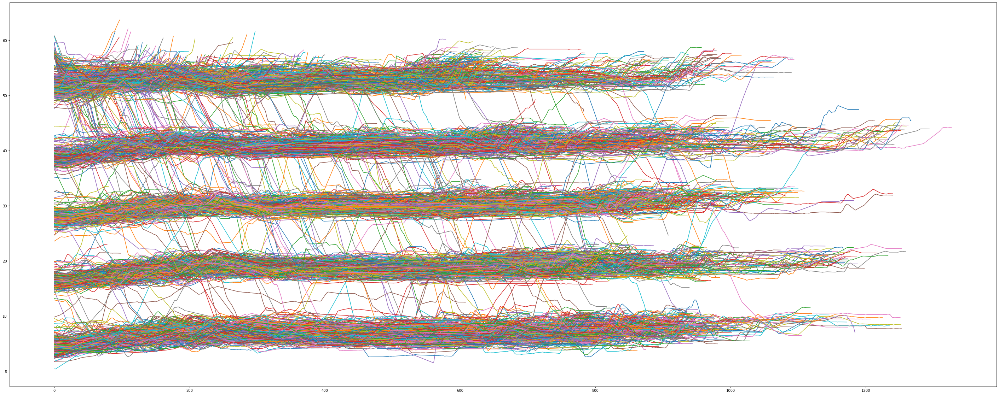

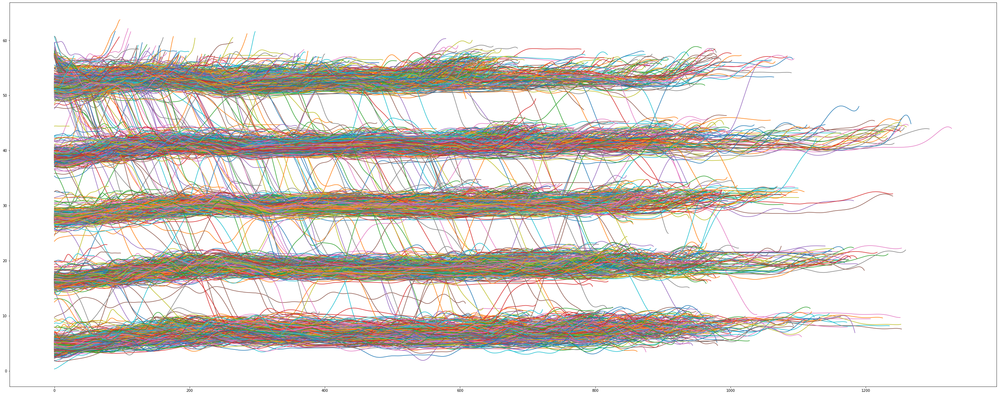

In [ ]:
from tqdm import tqdm as tqdm
input_set = [get_input(1, test_congested)]
for i in tqdm(range(2,3110)):
  temp = get_input(i, test_congested)
  if not type(temp) == type(None):
    input_set.append(temp)

# LSTM Data Preparation


---






In [ ]:
dataset = []
values = []
for i in range(len(input_set)):
	if not type(input_set[i]) == type(None):
		dataset.append(input_set[i])
		values.append(dataset[i].values)

NameError: ignored

In [ ]:
print('Printing... ...')
empty_dataframe= pd.DataFrame(columns = ['ego_x', 'ego_v', 'f_dx', 'f_dy', 'f_dv', 'b_dx', 'b_dy', 'b_dv', 'l_dx', 'l_dy',
                                   'l_dv', 'r_dx', 'r_dy', 'r_dv'])
for i in dataset: 
  empty_dataframe =pd.concat([empty_dataframe,i],axis=0,ignore_index=True)
print(empty_dataframe)
print(type(empty_dataframe))
print(len(empty_dataframe))
empty_dataframe.to_excel(Path+'/Final_result.xlsx', sheet_name = 'New_sheet')
empty_dataframe.to_csv(Path+'/Final_result.csv')

Printing... ...
            ego_x      ego_v       f_dx  ...       r_dx        r_dy      r_dv
0       51.816071  34.006429  30.000000  ...  30.000000  300.000000  0.000000
1       52.726857  35.324286  30.000000  ...  30.000000  300.000000  0.000000
2       53.001810  37.491429  30.000000  ...  30.000000  300.000000  0.000000
3       56.291381  39.865238  30.000000  ...  30.000000  300.000000  0.000000
4       29.079835  33.970674  30.000000  ...   9.564515    9.564515  0.190448
...           ...        ...        ...  ...        ...         ...       ...
150153  54.884292  31.266600   0.995212  ...  30.000000  300.000000  0.000000
150154  55.487412  30.799086   0.924888  ...  30.000000  300.000000  0.000000
150155  55.763696  30.041457   0.977016  ...  30.000000  300.000000  0.000000
150156  55.801684  29.671496   1.002816  ...  30.000000  300.000000  0.000000
150157  55.597185  30.006024  30.000000  ...  30.000000  300.000000  0.000000

[150158 rows x 14 columns]
<class 'pandas.core.

# Data construction for LSTM

（start here if previous data has been allocated)

---






In [7]:
nrows = 150158+1

feature_names = ['ego_x','ego_v', 'f_dx', 'f_dy', 'f_dv', 'b_dx', 'b_dy','b_dv', 'l_dx', 'l_dy', 'l_dv', 'r_dx', 'r_dy', 'r_dv']

# Label1: Ego vehicle lateral displacement
label_names_1 = ['ego_x']

# Label2: Ego vehicle longitudinal velocity
label_names_2 = ['ego_v']

time_columns = "index"

full_path = Path+'/Final_result.xlsx' 

train_rows=int(nrows*0.8) 

n_in = 10 
n_out_3, n_out_5, n_out_8, n_out_10 = 3,5,8,10

In [8]:
from tqdm import tqdm as tqdm
from sklearn.preprocessing import MinMaxScaler
df2 = pd.read_excel(full_path,parse_dates=[time_columns],nrows=nrows)
df2 = df2.sort_values(time_columns)
df2.index = np.arange(df2.shape[0])

In [9]:
#Normalization
scaler_y_1 = MinMaxScaler(feature_range=(-1, 1))
scaler_y_1.fit(df2[label_names_1].values.astype(float))

scaler_y_2 = MinMaxScaler(feature_range=(-1, 1))
scaler_y_2.fit(df2[label_names_2].values.astype(float))

scaler_x = MinMaxScaler(feature_range=(-1, 1))
scaler_x.fit(df2[feature_names].values.astype(float))

MinMaxScaler(feature_range=(-1, 1))

In [10]:
## Create dataset
def create_dataset(df,feature_names,label_names_1,abel_names_2,n_in,n_out,scaler_x=None,scaler_y_1 = None,scaler_y_2 = None):
  X, Y1, Y2 = [], [], []
  for i in tqdm(range(df.shape[0]-n_in-n_out+1)):
    # x_train.append(np.array(df[feature_names].iloc[i:i+n_in]))
    x = df[feature_names].values[i:i+n_in].astype(float)
    x = scaler_x.transform(x)
    label1 = df[label_names_1].values[i+n_in:i+n_in+n_out].astype(float)
    label1 = scaler_y_1.transform(label1)
    label2 = df[label_names_2].values[i+n_in:i+n_in+n_out].astype(float)
    label2 = scaler_y_2.transform(label2)
    # label = scaler_y.transform(label.reshape(-1,1)).reshape(-1)
    X.append(x)
    Y1.append(label1)
    Y2.append(label2)

    # break
  return np.array(X),np.array(Y1),np.array(Y2)

In [11]:
# Series Data to Supervised: Past 10 sec -> Future 3 sec
X_3, Y1_3, Y2_3 = create_dataset(df2,feature_names,label_names_1,label_names_2,n_in,n_out_3,scaler_x,scaler_y_1,scaler_y_2)

# Series Data to Supervised: Past 10 sec -> Future 5 sec
X_5, Y1_5, Y2_5 = create_dataset(df2,feature_names,label_names_1,label_names_2,n_in,n_out_5,scaler_x,scaler_y_1,scaler_y_2)

# Series Data to Supervised: Past 10 sec -> Future 8 sec
X_8, Y1_8, Y2_8 = create_dataset(df2,feature_names,label_names_1,label_names_2,n_in,n_out_8,scaler_x,scaler_y_1,scaler_y_2)

# Series Data to Supervised: Past 10 sec -> Future 10 sec
X_10, Y1_10, Y2_10 = create_dataset(df2,feature_names,label_names_1,label_names_2,n_in,n_out_10,scaler_x,scaler_y_1,scaler_y_2)

100%|██████████| 150139/150139 [20:23<00:00, 122.69it/s]


In [1]:
# 3 sec forecast
x_train_3, x_test_3 = X_3[:train_rows], X_3[train_rows:]
y1_train_3, y1_test_3 = Y1_3[:train_rows], Y1_3[train_rows:]
y2_train_3, y2_test_3 = Y2_3[:train_rows], Y2_3[train_rows:]
print(x_train_3.shape,x_test_3.shape,y1_train_3.shape,y1_test_3.shape,y2_train_3.shape,y2_test_3.shape)

# 5 sec forecast
x_train_5, x_test_5 = X_5[:train_rows], X_5[train_rows:]
y1_train_5, y1_test_5 = Y1_5[:train_rows], Y1_5[train_rows:]
y2_train_5, y2_test_5 = Y2_5[:train_rows], Y2_5[train_rows:]
print(x_train_5.shape,x_test_5.shape,y1_train_5.shape,y1_test_5.shape,y2_train_5.shape,y2_test_5.shape)

# 8 sec forecast
x_train_8, x_test_8 = X_8[:train_rows], X_8[train_rows:]
y1_train_8, y1_test_8 = Y1_8[:train_rows], Y1_8[train_rows:]
y2_train_8, y2_test_8 = Y2_8[:train_rows], Y2_8[train_rows:]
print(x_train_8.shape,x_test_8.shape,y1_train_8.shape,y1_test_8.shape,y2_train_8.shape,y2_test_8.shape)

# 10 sec forecast
x_train_10, x_test_10 = X_10[:train_rows], X_10[train_rows:]
y1_train_10, y1_test_10 = Y1_10[:train_rows], Y1_10[train_rows:]
y2_train_10, y2_test_10 = Y2_10[:train_rows], Y2_10[train_rows:]
print(x_train_10.shape,x_test_10.shape,y1_train_10.shape,y1_test_10.shape,y2_train_10.shape,y2_test_10.shape)

NameError: ignored

# 3s Forecaset

---






Ego_x

In [13]:
# Ego_x
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_3_x = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_3_x.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_3.shape[1], x_train_3.shape[2])))
regressor_3_x.add(Dropout(0.2))
regressor_3_x.add(Dense(units=3))
# regressor.add(Dense(units =(y_train.shape[1], y_train.shape[2])))

# Compiling the RNN
regressor_3_x.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_3_x = regressor_3_x.fit(x_train_3, y1_train_3, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 15s 7ms/step - loss: 0.0214
Epoch 2/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0150
Epoch 3/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0146
Epoch 4/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0143
Epoch 5/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0142
Epoch 6/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0141
Epoch 7/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0141
Epoch 8/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0140
Epoch 9/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0139
Epoch 10/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0139
Epoch 11/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0139
Epoch 12/20
1877/1877 [==============================] - 13s 7ms/step - lo

Ego_v

In [14]:
# out=3,y2
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_3_v = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_3_v.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_3.shape[1], x_train_3.shape[2])))
regressor_3_v.add(Dropout(0.2))
regressor_3_v.add(Dense(units = 3))

# Compiling the RNN
regressor_3_v.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_3_v=regressor_3_v.fit(x_train_3, y2_train_3, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 15s 7ms/step - loss: 0.0120
Epoch 2/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0056
Epoch 3/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0049
Epoch 4/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0046
Epoch 5/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0044
Epoch 6/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0043
Epoch 7/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0042
Epoch 8/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0041
Epoch 9/20
1877/1877 [==============================] - 14s 8ms/step - loss: 0.0041
Epoch 10/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0041
Epoch 11/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0040
Epoch 12/20
1877/1877 [==============================] - 14s 7ms/step - lo

# 5s Forecaset

---

Ego_x

In [15]:
# out=5,y1
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_5_x = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_5_x.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_5.shape[1], x_train_5.shape[2])))
regressor_5_x.add(Dropout(0.2))
regressor_5_x.add(Dense(units=5))
# regressor.add(Dense(units =(y_train.shape[1], y_train.shape[2])))

# Compiling the RNN
regressor_5_x.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_5_x = regressor_5_x.fit(x_train_5, y1_train_5, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 16s 8ms/step - loss: 0.0316
Epoch 2/20
1877/1877 [==============================] - 14s 8ms/step - loss: 0.0219
Epoch 3/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0212
Epoch 4/20
1877/1877 [==============================] - 14s 8ms/step - loss: 0.0209
Epoch 5/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0207
Epoch 6/20
1877/1877 [==============================] - 14s 8ms/step - loss: 0.0206
Epoch 7/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0205
Epoch 8/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0204
Epoch 9/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0203
Epoch 10/20
1877/1877 [==============================] - 14s 8ms/step - loss: 0.0204
Epoch 11/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0203
Epoch 12/20
1877/1877 [==============================] - 14s 7ms/step - lo

Ego_v

In [16]:
# out=5,y2
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_5_v = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_5_v.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_5.shape[1], x_train_5.shape[2])))
regressor_5_v.add(Dropout(0.2))
regressor_5_v.add(Dense(units = 5))

# Compiling the RNN
regressor_5_v.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_5_v = regressor_5_v.fit(x_train_5, y2_train_5, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 15s 7ms/step - loss: 0.0168
Epoch 2/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0092
Epoch 3/20
1877/1877 [==============================] - 14s 8ms/step - loss: 0.0082
Epoch 4/20
1877/1877 [==============================] - 14s 8ms/step - loss: 0.0078
Epoch 5/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0075
Epoch 6/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0073
Epoch 7/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0072
Epoch 8/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0071
Epoch 9/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0070
Epoch 10/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0069
Epoch 11/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0068
Epoch 12/20
1877/1877 [==============================] - 14s 8ms/step - lo

# 8s Forecaset

---

Ego_x

In [17]:
# out=8,y1
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_8_x = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_8_x.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_8.shape[1], x_train_8.shape[2])))
regressor_8_x.add(Dropout(0.2))
regressor_8_x.add(Dense(units = 8))

# Compiling the RNN
regressor_8_x.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_8_x = regressor_8_x.fit(x_train_8, y1_train_8, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 15s 7ms/step - loss: 0.0407
Epoch 2/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0321
Epoch 3/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0315
Epoch 4/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0312
Epoch 5/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0309
Epoch 6/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0309
Epoch 7/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0308
Epoch 8/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0306
Epoch 9/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0305
Epoch 10/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0304
Epoch 11/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0303
Epoch 12/20
1877/1877 [==============================] - 13s 7ms/step - lo

Ego_v

In [18]:
# out=8,y2
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_8_v = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_8_v.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_8.shape[1], x_train_8.shape[2])))
regressor_8_v.add(Dropout(0.2))
regressor_8_v.add(Dense(units = 8))

# Compiling the RNN
regressor_8_v.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_8_v = regressor_8_v.fit(x_train_8, y2_train_8, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 15s 7ms/step - loss: 0.0257
Epoch 2/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0168
Epoch 3/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0154
Epoch 4/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0146
Epoch 5/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0141
Epoch 6/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0138
Epoch 7/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0135
Epoch 8/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0133
Epoch 9/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0131
Epoch 10/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0129
Epoch 11/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0128
Epoch 12/20
1877/1877 [==============================] - 13s 7ms/step - lo

# 10s Forecaset

---

Ego_x

In [19]:
# out=10,y1
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_10_x = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_10_x.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_10.shape[1], x_train_10.shape[2])))
regressor_10_x.add(Dropout(0.2))
regressor_10_x.add(Dense(units = 10))

# Compiling the RNN
regressor_10_x.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_10_x = regressor_10_x.fit(x_train_10, y1_train_10, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 15s 7ms/step - loss: 0.0488
Epoch 2/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0392
Epoch 3/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0384
Epoch 4/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0381
Epoch 5/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0379
Epoch 6/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0377
Epoch 7/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0374
Epoch 8/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0373
Epoch 9/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0371
Epoch 10/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0369
Epoch 11/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0367
Epoch 12/20
1877/1877 [==============================] - 13s 7ms/step - lo

Ego_v

In [20]:
# out=10,y2
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout

# Initialising the RNN
regressor_10_v = Sequential()

# Adding the first LSTM layer and some Dropout regularisation
layer_1_units=50
regressor_10_v.add(LSTM(units = layer_1_units, return_sequences = False,
                   input_shape = (x_train_10.shape[1], x_train_10.shape[2])))
regressor_10_v.add(Dropout(0.2))
regressor_10_v.add(Dense(units = 10))

# Compiling the RNN
regressor_10_v.compile(optimizer = 'adam', loss = 'mean_squared_error')

# Fitting the RNN to the Training set
epoch_no=20
batch_size_RNN=64
model_10_v = regressor_10_v.fit(x_train_10, y2_train_10, epochs = epoch_no, batch_size = batch_size_RNN)

Epoch 1/20
1877/1877 [==============================] - 15s 7ms/step - loss: 0.0324
Epoch 2/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0227
Epoch 3/20
1877/1877 [==============================] - 14s 7ms/step - loss: 0.0210
Epoch 4/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0201
Epoch 5/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0194
Epoch 6/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0189
Epoch 7/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0185
Epoch 8/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0182
Epoch 9/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0180
Epoch 10/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0177
Epoch 11/20
1877/1877 [==============================] - 13s 7ms/step - loss: 0.0174
Epoch 12/20
1877/1877 [==============================] - 13s 7ms/step - lo

# Loss Ego_x

---







<function matplotlib.pyplot.show>

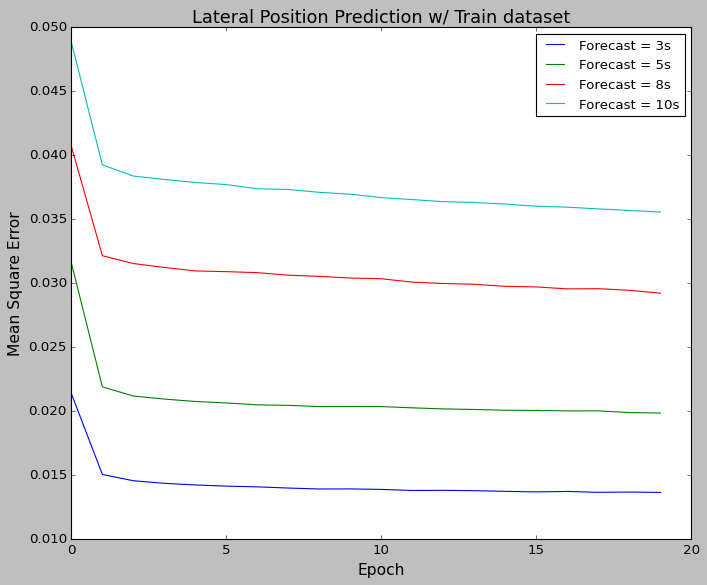

In [283]:
#loss ego_v
plt.figure(figsize=(10, 8))
plt.plot(model_3_x.history['loss'], label='Forecast = 3s')
plt.plot(model_5_x.history['loss'], label='Forecast = 5s')
plt.plot(model_8_x.history['loss'], label='Forecast = 8s')
plt.plot(model_10_x.history['loss'], label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Epoch', fontsize='14')
plt.ylabel('Mean Square Error', fontsize='14')
plt.style.use("classic")
plt.show

# Loss Ego_v

---

<function matplotlib.pyplot.show>

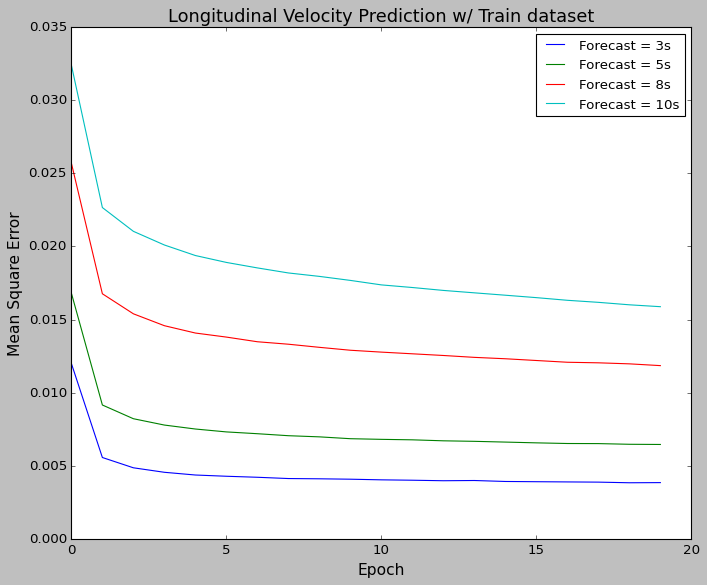

In [284]:
#loss ego_x
plt.figure(figsize=(10, 8))
plt.plot(model_3_v.history['loss'], label='Forecast = 3s')
plt.plot(model_5_v.history['loss'], label='Forecast = 5s')
plt.plot(model_8_v.history['loss'], label='Forecast = 8s')
plt.plot(model_10_v.history['loss'], label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Epoch', fontsize='14')
plt.ylabel('Mean Square Error', fontsize='14')
plt.show

# Model Prediction using train/test set



---

In [285]:
trainPredict_3_x = regressor_3_x.predict(x_train_3)
trainPredict_3_v = regressor_3_v.predict(x_train_3)
trainPredict_5_x = regressor_5_x.predict(x_train_5)
trainPredict_5_v = regressor_5_v.predict(x_train_5)
trainPredict_8_x = regressor_8_x.predict(x_train_8)
trainPredict_8_v = regressor_8_v.predict(x_train_8)
trainPredict_10_x = regressor_10_x.predict(x_train_10)
trainPredict_10_v = regressor_10_v.predict(x_train_10)

y1_train_act =  scaler_y_1.inverse_transform(y1_train_10.reshape(120127, 10))
y2_train_act =  scaler_y_2.inverse_transform(y2_train_10.reshape(120127, 10))

trainPredict_3_x_act = scaler_y_1.inverse_transform(trainPredict_3_x)
trainPredict_3_v_act = scaler_y_2.inverse_transform(trainPredict_3_v)
trainPredict_5_x_act = scaler_y_1.inverse_transform(trainPredict_5_x)
trainPredict_5_v_act = scaler_y_2.inverse_transform(trainPredict_5_v)
trainPredict_8_x_act = scaler_y_1.inverse_transform(trainPredict_8_x)
trainPredict_8_v_act = scaler_y_2.inverse_transform(trainPredict_8_v)
trainPredict_10_x_act = scaler_y_1.inverse_transform(trainPredict_10_x)
trainPredict_10_v_act = scaler_y_2.inverse_transform(trainPredict_10_v)

In [286]:
testPredict_3_x = regressor_3_x.predict(x_test_3)
testPredict_3_v = regressor_3_v.predict(x_test_3)
testPredict_5_x = regressor_5_x.predict(x_test_5)
testPredict_5_v = regressor_5_v.predict(x_test_5)
testPredict_8_x = regressor_8_x.predict(x_test_8)
testPredict_8_v = regressor_8_v.predict(x_test_8)
testPredict_10_x = regressor_10_x.predict(x_test_10)
testPredict_10_v = regressor_10_v.predict(x_test_10)

y1_test_act =  scaler_y_1.inverse_transform(y1_test_10.reshape(30012, 10))
y2_test_act =  scaler_y_2.inverse_transform(y2_test_10.reshape(30012, 10))

testPredict_3_x_act = scaler_y_1.inverse_transform(testPredict_3_x)
testPredict_3_v_act = scaler_y_2.inverse_transform(testPredict_3_v)
testPredict_5_x_act = scaler_y_1.inverse_transform(testPredict_5_x)
testPredict_5_v_act = scaler_y_2.inverse_transform(testPredict_5_v)
testPredict_8_x_act = scaler_y_1.inverse_transform(testPredict_8_x)
testPredict_8_v_act = scaler_y_2.inverse_transform(testPredict_8_v)
testPredict_10_x_act = scaler_y_1.inverse_transform(testPredict_10_x)
testPredict_10_v_act = scaler_y_2.inverse_transform(testPredict_10_v)

In [287]:
testPredict_3_x_act[0]

array([28.21389 , 28.433306, 28.541664], dtype=float32)

# Plotting: Forecast = 3s w/Train Dataset



---

In [288]:
from sklearn.metrics import mean_squared_error

<function matplotlib.pyplot.show>

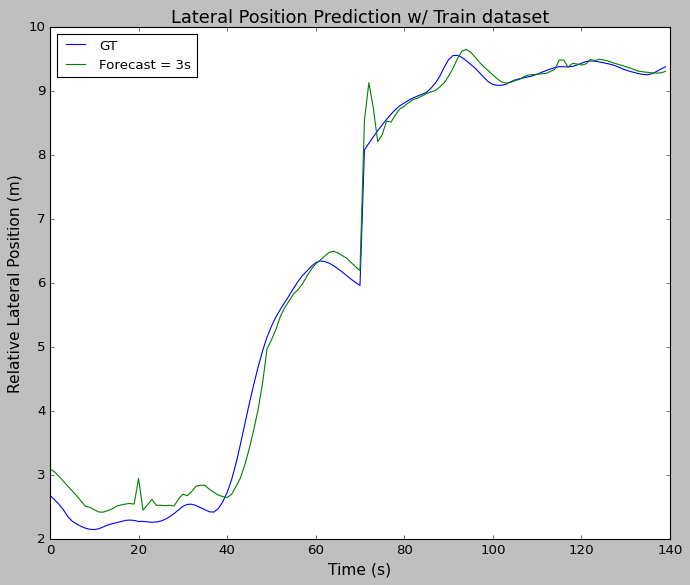

In [289]:
plt.figure(figsize=(10, 8))
plt.plot(y1_train_act[8080:8220,2]/3.28084,label='GT')
plt.plot(trainPredict_3_x_act[8080:8220,2]/3.28084,label='Forecast = 3s')
# plt.plot(trainPredict_5_x_act[8080:8220,2]/3.28084,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [290]:
rms = mean_squared_error(y1_train_act[8080:8220,2]/3.28084, trainPredict_3_x_act[8080:8220,2]/3.28084, squared=False)
print(rms)

0.2564785773965971


<function matplotlib.pyplot.show>

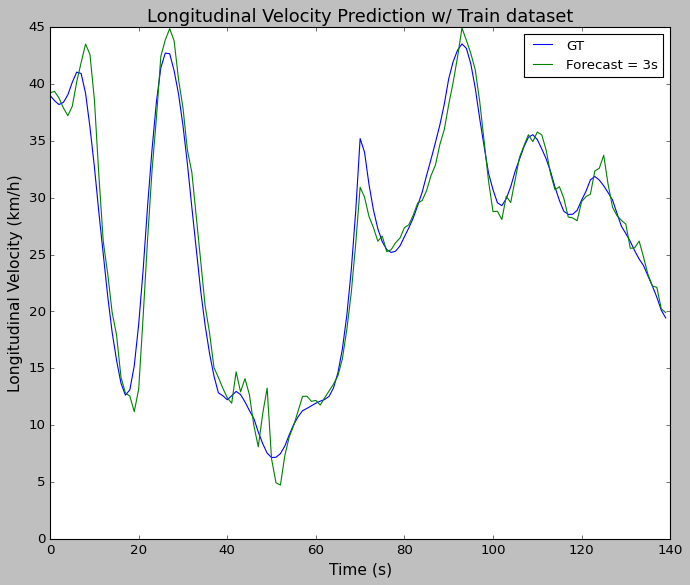

In [291]:
plt.figure(figsize=(10, 8))
plt.plot(y2_train_act[8080:8220,2]*1.09728,label='GT')
plt.plot(trainPredict_3_v_act[8080:8220,2]*1.09728,label='Forecast = 3s')
# plt.plot(trainPredict_5_x_act[8080:8220,2]/3.28084,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [292]:
rms = mean_squared_error(y2_train_act[8080:8220,2]*1.09728, trainPredict_3_v_act[8080:8220,2]*1.09728, squared=False)
print(rms)

1.8107711151998107


# Plotting: Forecast = 5s w/Train Dataset



---


<function matplotlib.pyplot.show>

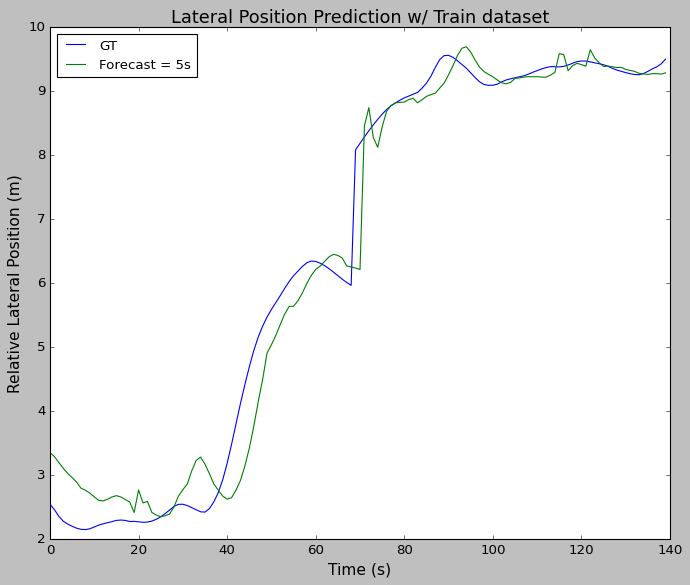

In [293]:
plt.figure(figsize=(10, 8))
plt.plot(y1_train_act[8080:8220,4]/3.28084,label='GT')
plt.plot(trainPredict_5_x_act[8080:8220,4]/3.28084,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [294]:
rms = mean_squared_error(y1_train_act[8080:8220,4]/3.28084, trainPredict_5_x_act[8080:8220,4]/3.28084, squared=False)
print(rms)

0.47898266317099936


<function matplotlib.pyplot.show>

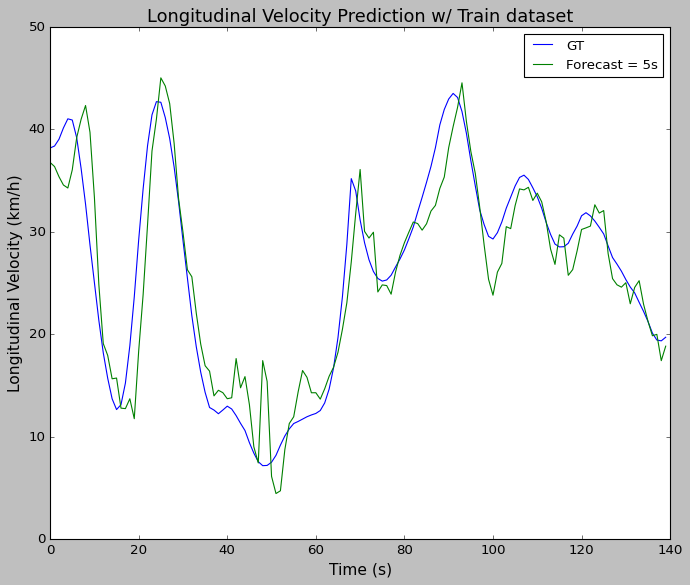

In [295]:
plt.figure(figsize=(10, 8))
plt.plot(y2_train_act[8080:8220,4]*1.09728,label='GT')
plt.plot(trainPredict_5_v_act[8080:8220,4]*1.09728,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [296]:
rms = mean_squared_error(y2_train_act[8080:8220,4]*1.09728, trainPredict_5_v_act[8080:8220,4]*1.09728, squared=False)
print(rms)

3.7205631773501526


# Plotting: Forecast = 8s w/Train Dataset



---

<function matplotlib.pyplot.show>

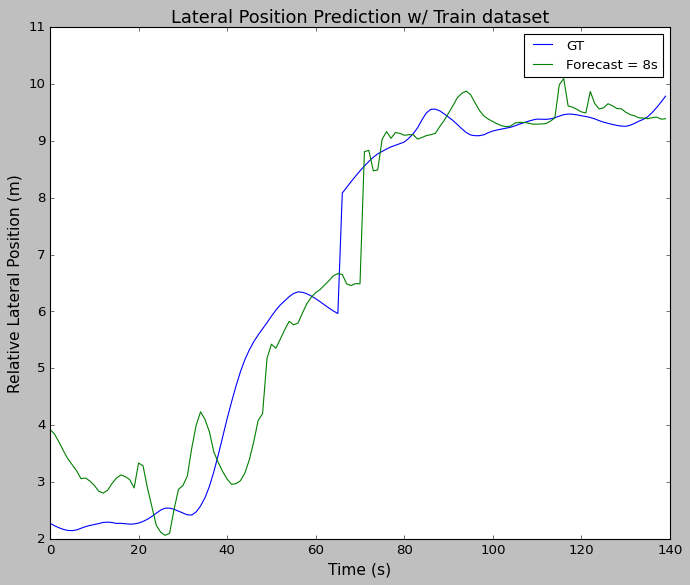

In [297]:
plt.figure(figsize=(10, 8))
plt.plot(y1_train_act[8080:8220,7]/3.28084,label='GT')
plt.plot(trainPredict_8_x_act[8080:8220,7]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [298]:
rms = mean_squared_error(y1_train_act[8080:8220,7]/3.28084, trainPredict_8_x_act[8080:8220,7]/3.28084, squared=False)
print(rms)

0.7781065186037471


<function matplotlib.pyplot.show>

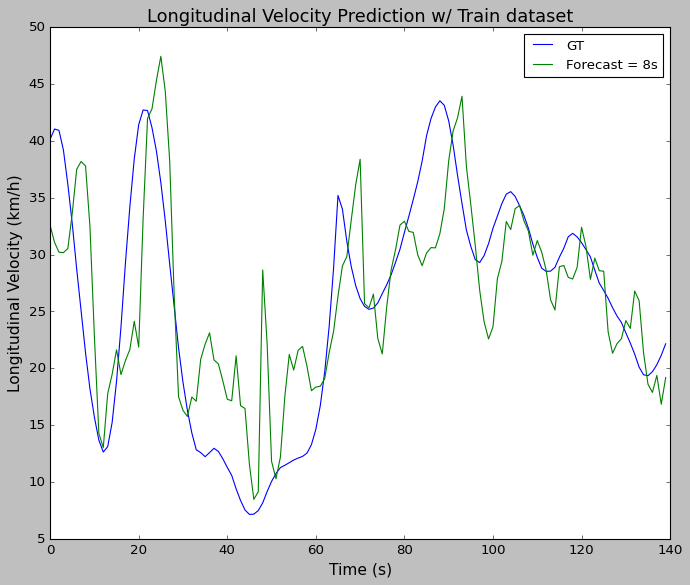

In [299]:
plt.figure(figsize=(10, 8))
plt.plot(y2_train_act[8080:8220,7]*1.09728,label='GT')
plt.plot(trainPredict_8_v_act[8080:8220,7]*1.09728,label='Forecast = 8s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [300]:
rms = mean_squared_error(y2_train_act[8080:8220,7]*1.09728, trainPredict_8_v_act[8080:8220,7]*1.09728, squared=False)
print(rms)

6.697536829791474


# Plotting: Forecast = 10s w/Train Dataset



---

<function matplotlib.pyplot.show>

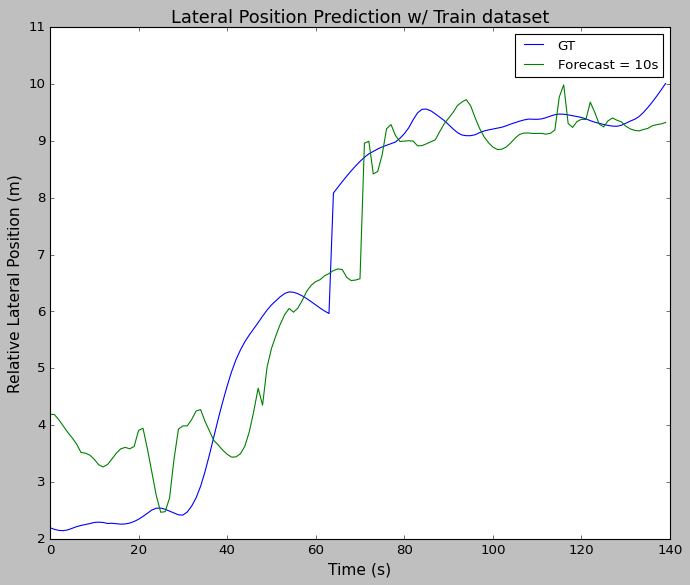

In [301]:
plt.figure(figsize=(10, 8))
plt.plot(y1_train_act[8080:8220,9]/3.28084,label='GT')
plt.plot(trainPredict_10_x_act[8080:8220,9]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [302]:
rms = mean_squared_error(y1_train_act[8080:8220,9]/3.28084, trainPredict_10_x_act[8080:8220,9]/3.28084, squared=False)
print(rms)

0.9244760819358188


<function matplotlib.pyplot.show>

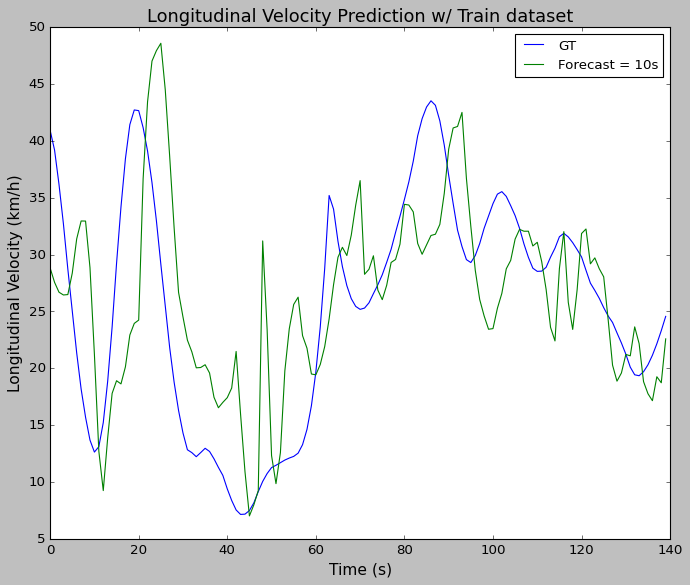

In [303]:
plt.figure(figsize=(10, 8))
plt.plot(y2_train_act[8080:8220,9]*1.09728,label='GT')
plt.plot(trainPredict_10_v_act[8080:8220,9]*1.09728,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [304]:
rms = mean_squared_error(y2_train_act[8080:8220,9]*1.09728, trainPredict_10_v_act[8080:8220,9]*1.09728, squared=False)
print(rms)

8.360230422702491


# Overall Comparison w/ Train Dataset



---

<function matplotlib.pyplot.show>

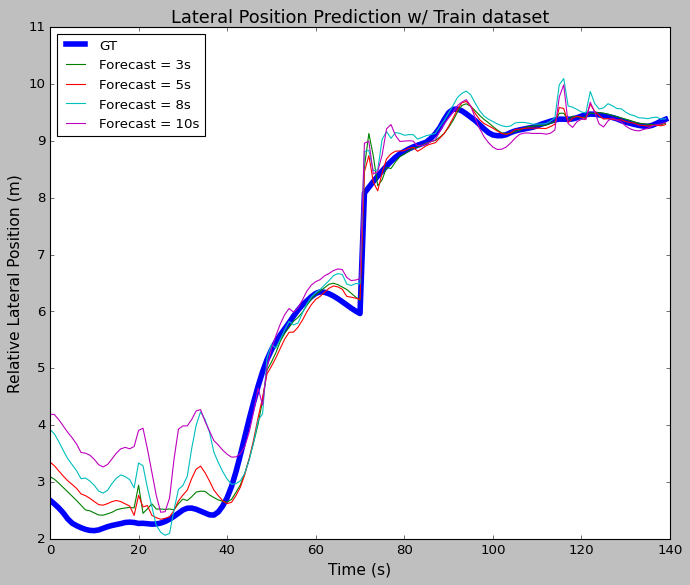

In [305]:
plt.figure(figsize=(10, 8))
plt.plot(y1_train_act[8080:8220,2]/3.28084,linewidth=5,label='GT')
plt.plot(trainPredict_3_x_act[8080:8220,2]/3.28084,label='Forecast = 3s')
plt.plot(trainPredict_5_x_act[8080:8220,4]/3.28084,label='Forecast = 5s')
plt.plot(trainPredict_8_x_act[8080:8220,7]/3.28084,label='Forecast = 8s')
plt.plot(trainPredict_10_x_act[8080:8220,9]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

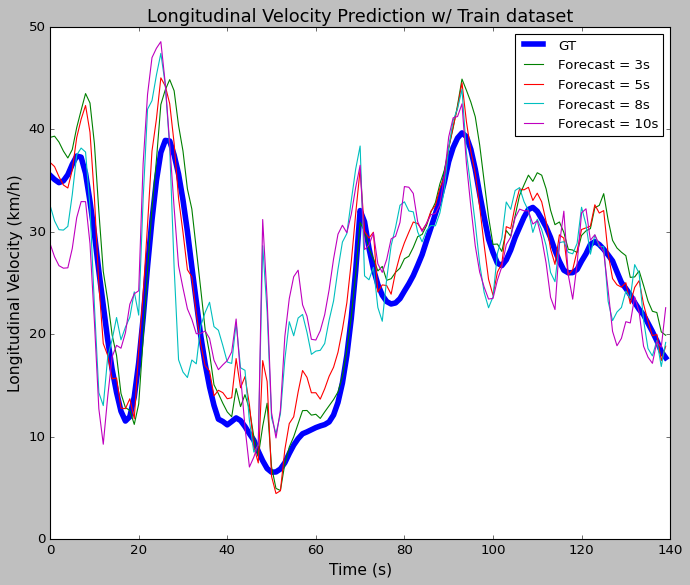

In [306]:
plt.figure(figsize=(10, 8))
plt.plot(y2_train_act[8080:8220,2],linewidth=5,label='GT')
plt.plot(trainPredict_3_v_act[8080:8220,2]*1.09728,label='Forecast = 3s')
plt.plot(trainPredict_5_v_act[8080:8220,4]*1.09728,label='Forecast = 5s')
plt.plot(trainPredict_8_v_act[8080:8220,7]*1.09728,label='Forecast = 8s')
plt.plot(trainPredict_10_v_act[8080:8220,9]*1.09728,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Train dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

# Plotting: Forecast = 3s w/Test Dataset



---

<function matplotlib.pyplot.show>

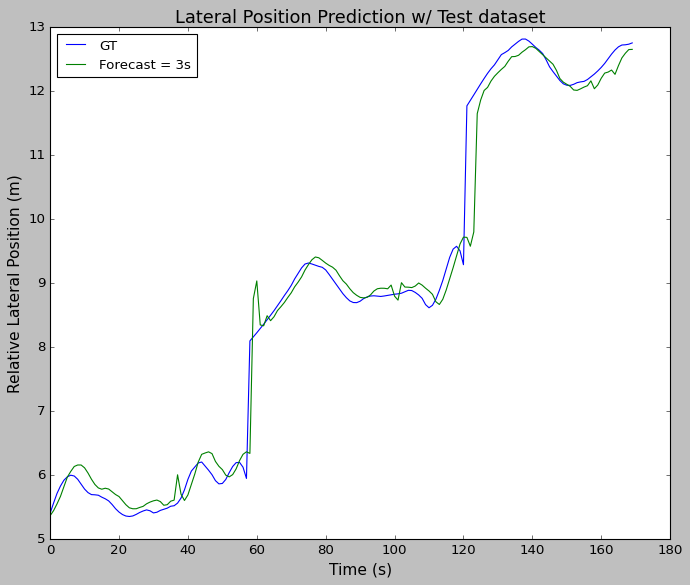

In [307]:
plt.figure(figsize=(10, 8))
plt.plot(y1_test_act[10200:10370,2]/3.28084,label='GT')
plt.plot(testPredict_3_x_act[10200:10370,2]/3.28084,label='Forecast = 3s')
# plt.plot(trainPredict_5_x_act[8080:8220,2]/3.28084,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [308]:
rms = mean_squared_error(y1_test_act[10200:10370,2]/3.28084, testPredict_3_x_act[10200:10370,2]/3.28084, squared=False)
print(rms)

0.3687200728892555


<function matplotlib.pyplot.show>

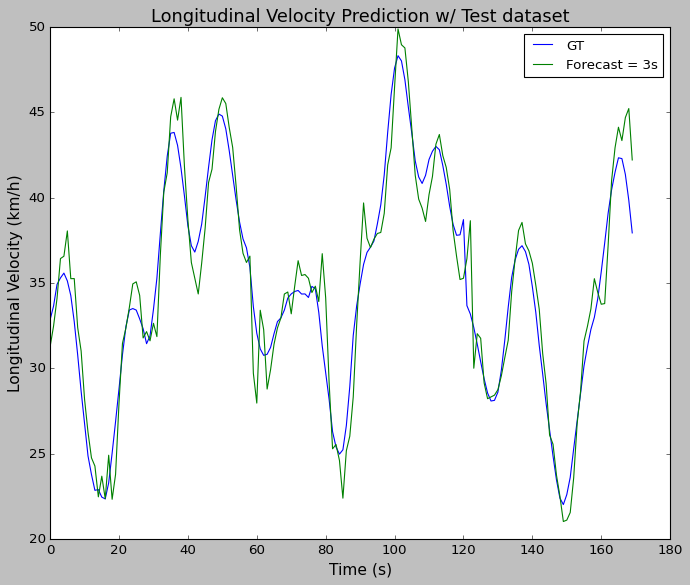

In [309]:
plt.figure(figsize=(10, 8))
plt.plot(y2_test_act[10200:10370,2]*1.09728,label='GT')
plt.plot(testPredict_3_v_act[10200:10370,2]*1.09728,label='Forecast = 3s')
# plt.plot(trainPredict_5_x_act[8080:8220,2]/3.28084,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [310]:
rms = mean_squared_error(y2_test_act[10200:10370,2]*1.09728, testPredict_3_v_act[10200:10370,2]*1.09728, squared=False)
print(rms)

1.7939568994903565


# Plotting: Forecast = 5s w/Test Dataset



---

<function matplotlib.pyplot.show>

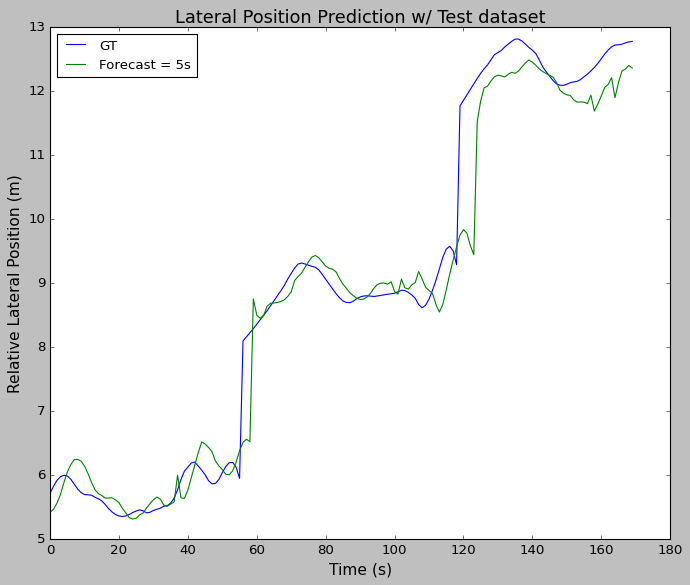

In [311]:
plt.figure(figsize=(10, 8))
plt.plot(y1_test_act[10200:10370,4]/3.28084,label='GT')
plt.plot(testPredict_5_x_act[10200:10370,4]/3.28084,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [312]:
rms = mean_squared_error(y1_test_act[10200:10370,4]/3.28084, testPredict_5_x_act[10200:10370,4]/3.28084, squared=False)
print(rms)

0.5376522111257717


<function matplotlib.pyplot.show>

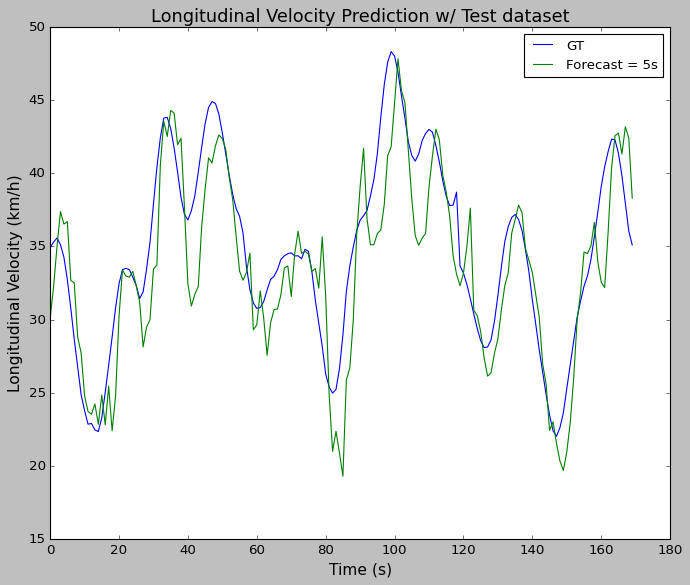

In [313]:
plt.figure(figsize=(10, 8))
plt.plot(y2_test_act[10200:10370,4]*1.09728,label='GT')
plt.plot(testPredict_5_v_act[10200:10370,4]*1.09728,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [314]:
rms = mean_squared_error(y2_test_act[10200:10370,4]*1.09728, testPredict_5_v_act[10200:10370,4]*1.09728, squared=False)
print(rms)

3.454142381477356


# Plotting: Forecast = 8s w/Test Dataset



---

<function matplotlib.pyplot.show>

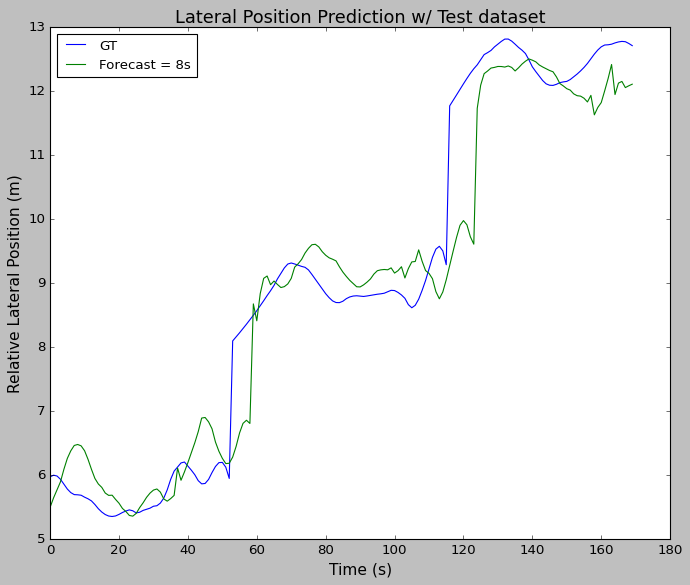

In [315]:
plt.figure(figsize=(10, 8))
plt.plot(y1_test_act[10200:10370,7]/3.28084,label='GT')
plt.plot(testPredict_8_x_act[10200:10370,7]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [316]:
rms = mean_squared_error(y1_test_act[10200:10370,7]/3.28084, testPredict_8_x_act[10200:10370,7]/3.28084, squared=False)
print(rms)

0.729052178629923


<function matplotlib.pyplot.show>

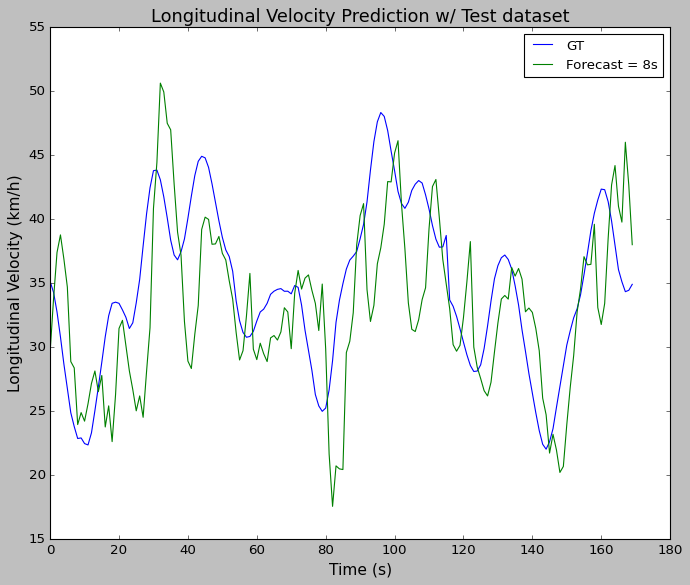

In [317]:
plt.figure(figsize=(10, 8))
plt.plot(y2_test_act[10200:10370,7]*1.09728,label='GT')
plt.plot(testPredict_8_v_act[10200:10370,7]*1.09728,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [318]:
rms = mean_squared_error(y2_test_act[10200:10370,7]*1.09728, testPredict_8_v_act[10200:10370,7]*1.09728, squared=False)
print(rms)

6.013445416324817


# Plotting: Forecast = 10s w/Test Dataset



---

<function matplotlib.pyplot.show>

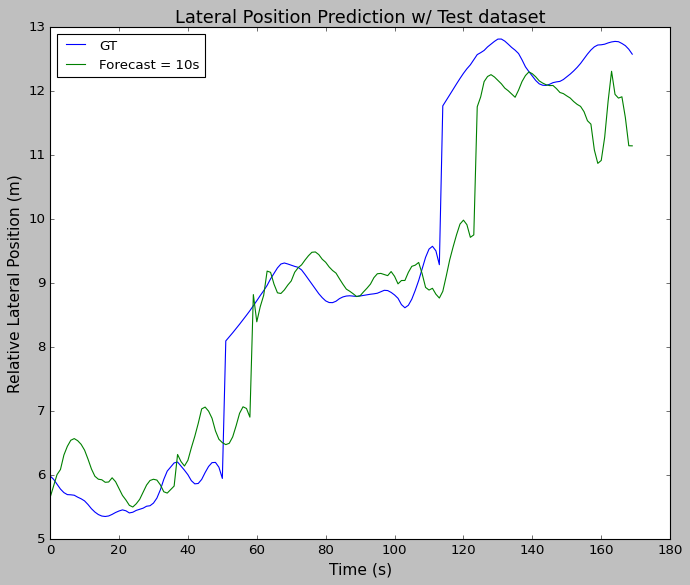

In [319]:
plt.figure(figsize=(10, 8))
plt.plot(y1_test_act[10200:10370,9]/3.28084,label='GT')
plt.plot(testPredict_10_x_act[10200:10370,9]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [320]:
rms = mean_squared_error(y1_test_act[10200:10370,9]/3.28084, testPredict_10_x_act[10200:10370,9]/3.28084, squared=False)
print(rms)

0.8972580816158324


<function matplotlib.pyplot.show>

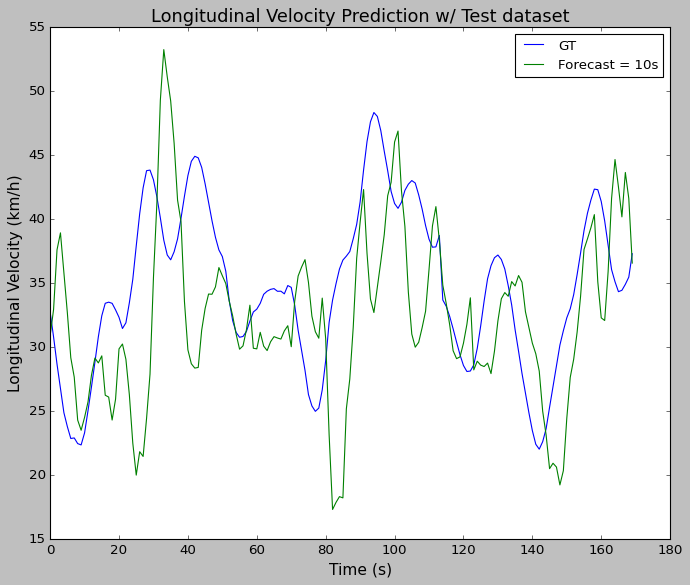

In [321]:
plt.figure(figsize=(10, 8))
plt.plot(y2_test_act[10200:10370,9]*1.09728,label='GT')
plt.plot(testPredict_10_v_act[10200:10370,9]*1.09728,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

In [322]:
rms = mean_squared_error(y2_test_act[10200:10370,9]*1.09728, testPredict_10_v_act[10200:10370,9]*1.09728, squared=False)
print(rms)

7.792189475976772


# Overall Comparison w/ Test Dataset



---


<function matplotlib.pyplot.show>

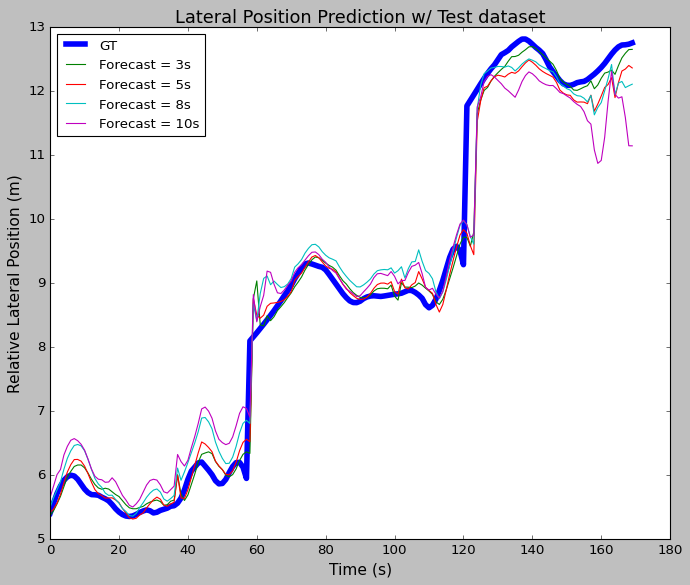

In [323]:
plt.figure(figsize=(10, 8))
plt.plot(y1_test_act[10200:10370,2]/3.28084,linewidth=5,label='GT')
plt.plot(testPredict_3_x_act[10200:10370,2]/3.28084,label='Forecast = 3s')
plt.plot(testPredict_5_x_act[10200:10370,4]/3.28084,label='Forecast = 5s')
plt.plot(testPredict_8_x_act[10200:10370,7]/3.28084,label='Forecast = 8s')
plt.plot(testPredict_10_x_act[10200:10370,9]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

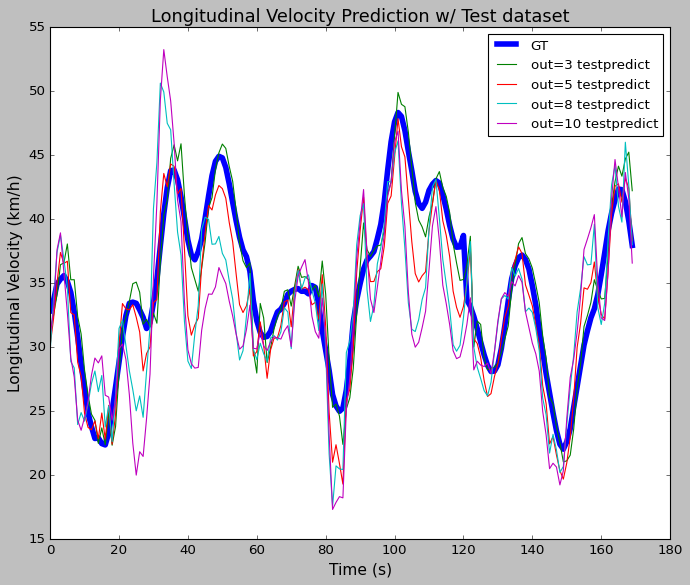

In [324]:
plt.figure(figsize=(10, 8))
plt.plot(y2_test_act[10200:10370,2]*1.09728,linewidth=5,label='GT')
plt.plot(testPredict_3_v_act[10200:10370,2]*1.09728,label='out=3 testpredict')
plt.plot(testPredict_5_v_act[10200:10370,4]*1.09728,label='out=5 testpredict')
plt.plot(testPredict_8_v_act[10200:10370,7]*1.09728,label='out=8 testpredict')
plt.plot(testPredict_10_v_act[10200:10370,9]*1.09728,label='out=10 testpredict')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

# **Testing w/ shift**

---



<function matplotlib.pyplot.show>

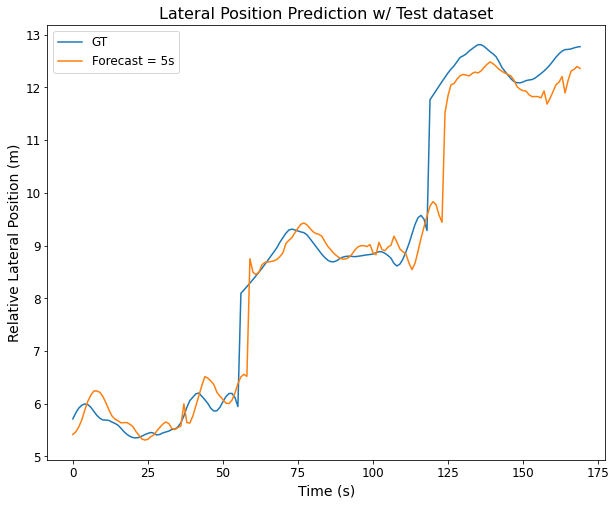

In [63]:
#5x shifted
shift = 0

plt.figure(figsize=(10, 8))
# plt.plot(range(shift,shift+len(y1_test_act[10200:10370,4])),y1_test_act[10200:10370,4]/3.28084,label='GT')
plt.plot(y1_test_act[10200:10370,4]/3.28084,label='GT')
plt.plot(testPredict_5_x_act[10200:10370,4]/3.28084,label='Forecast = 5s')
# plt.plot(trainPredict_8_x_act[8080:8220,2]/3.28084,label='Forecast = 8s')
# plt.plot(trainPredict_10_x_act[8080:8220,2]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [64]:
rms = mean_squared_error(y1_test_act[10200-3:10370-3,4]/3.28084, (testPredict_5_x_act[10200:10370,4]/3.28084), squared=False)
print(rms)

0.34049550064066536


<function matplotlib.pyplot.show>

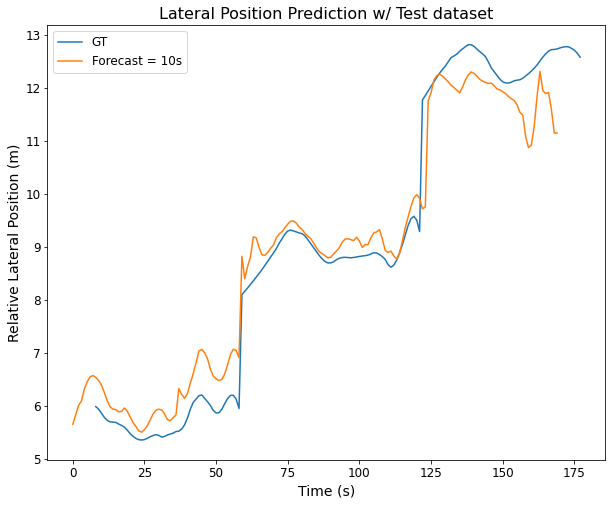

In [65]:
#10x shifted
shift = 8

plt.figure(figsize=(10, 8))
plt.plot(range(shift,shift+len(y1_test_act[10200:10370,4])),y1_test_act[10200:10370,9]/3.28084,label='GT')
plt.plot(testPredict_10_x_act[10200:10370,9]/3.28084,label='Forecast = 10s')
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

In [66]:
rms = mean_squared_error(y1_test_act[10200-shift:10370-shift,9]/3.28084, testPredict_10_x_act[10200:10370,9]/3.28084, squared=False)
print(rms)

0.5549177870766804


# **Trajectory Plotting at each step (10s Forecast)**

---

<function matplotlib.pyplot.show>

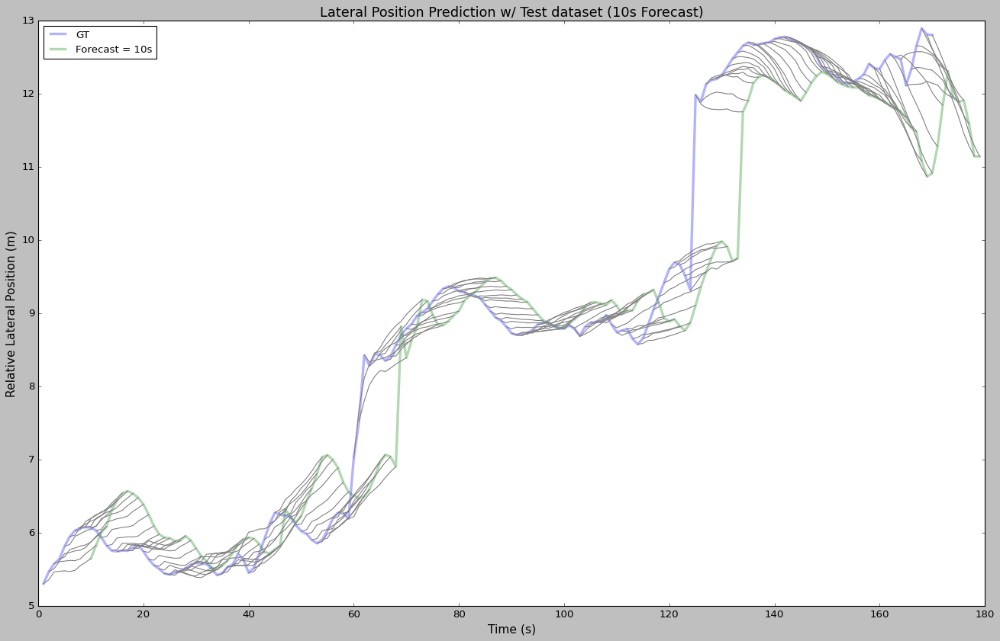

In [354]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_10_x_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
plt.plot(range(10,180),testPredict_10_x_act[10200:10370,9]/3.28084,'green',label='Forecast = 10s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+10),testPredict_10_x_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset (10s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

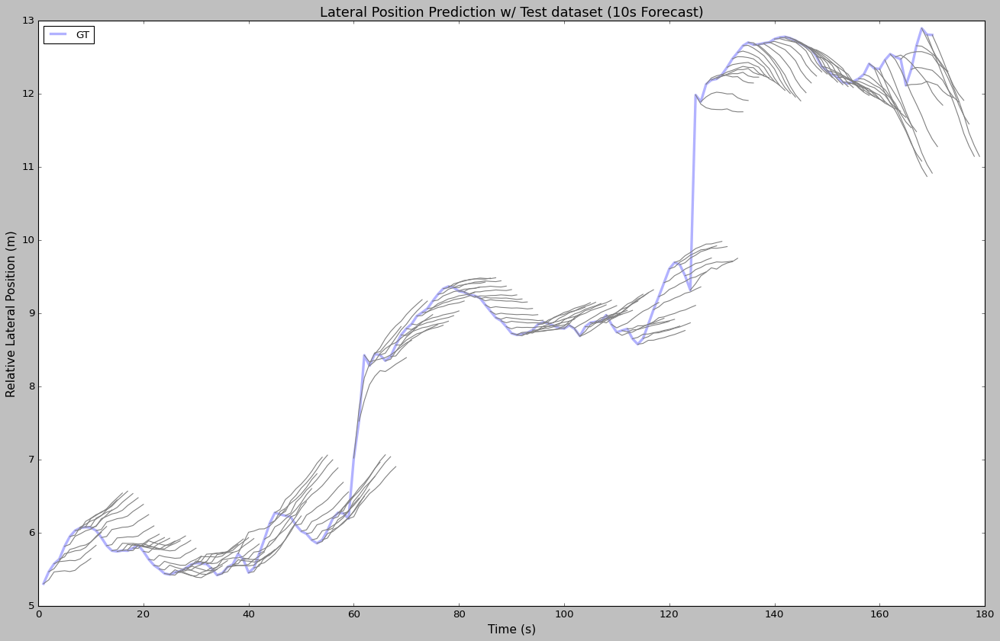

In [355]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_10_x_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
# plt.plot(range(10,180),testPredict_10_x_act[10200:10370,9]/3.28084,'green',label='Forecast = 10s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+10),testPredict_10_x_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset (10s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

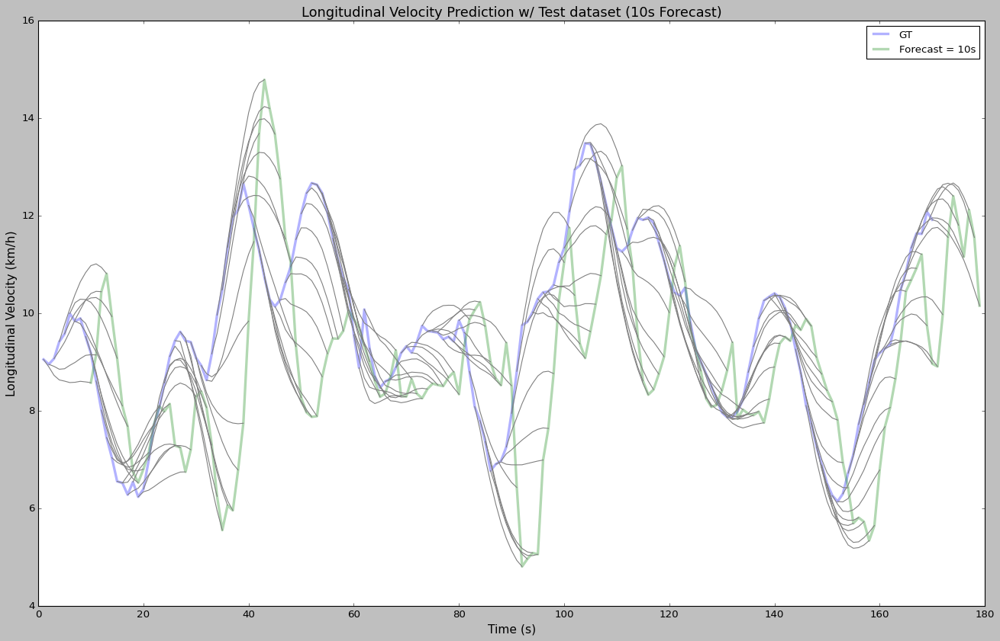

In [356]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_10_v_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
plt.plot(range(10,180),testPredict_10_v_act[10200:10370,9]/3.28084,'green',label='Forecast = 10s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+10),testPredict_10_v_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset (10s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

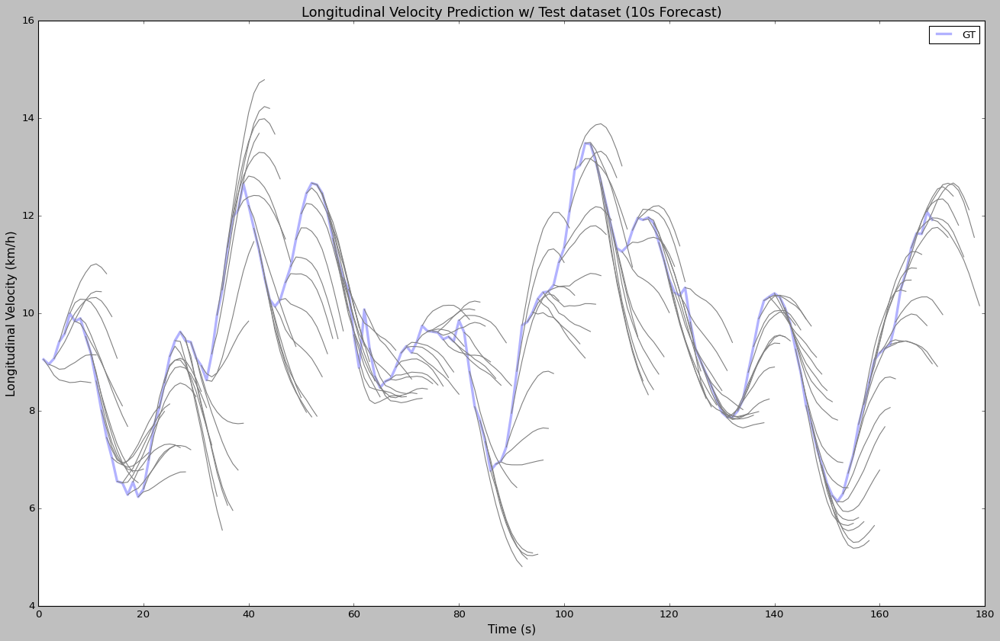

In [357]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_10_v_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
# plt.plot(range(10,180),testPredict_10_v_act[10200:10370,9]/3.28084,'green',label='Forecast = 10s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+10),testPredict_10_v_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset (10s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

# **Trajectory Plotting at each step (5s Forecast)**

---

<function matplotlib.pyplot.show>

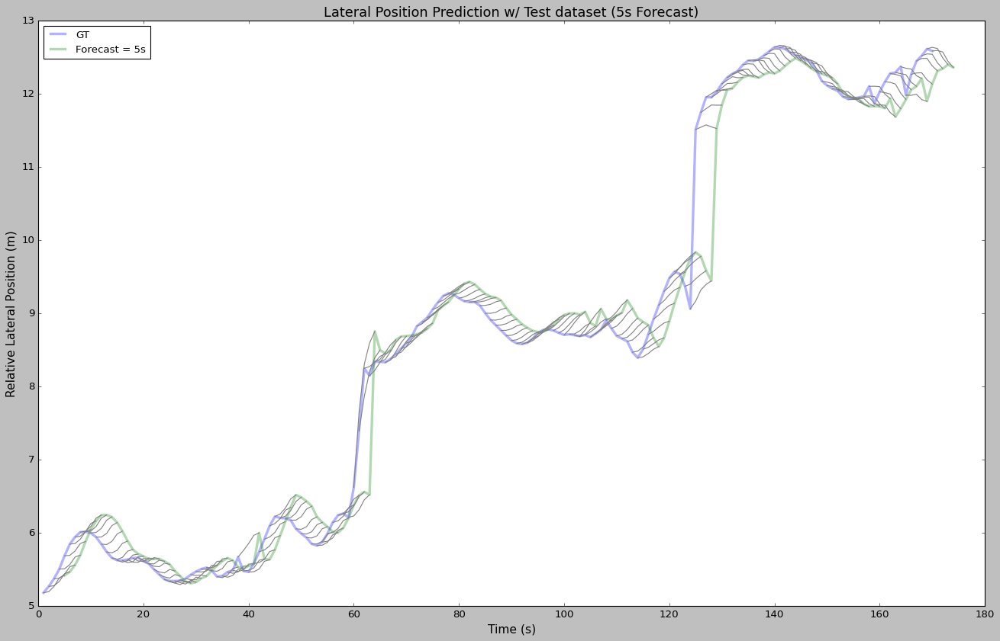

In [358]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_5_x_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
plt.plot(range(5,175),testPredict_5_x_act[10200:10370,4]/3.28084,'green',label='Forecast = 5s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+5),testPredict_5_x_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset (5s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

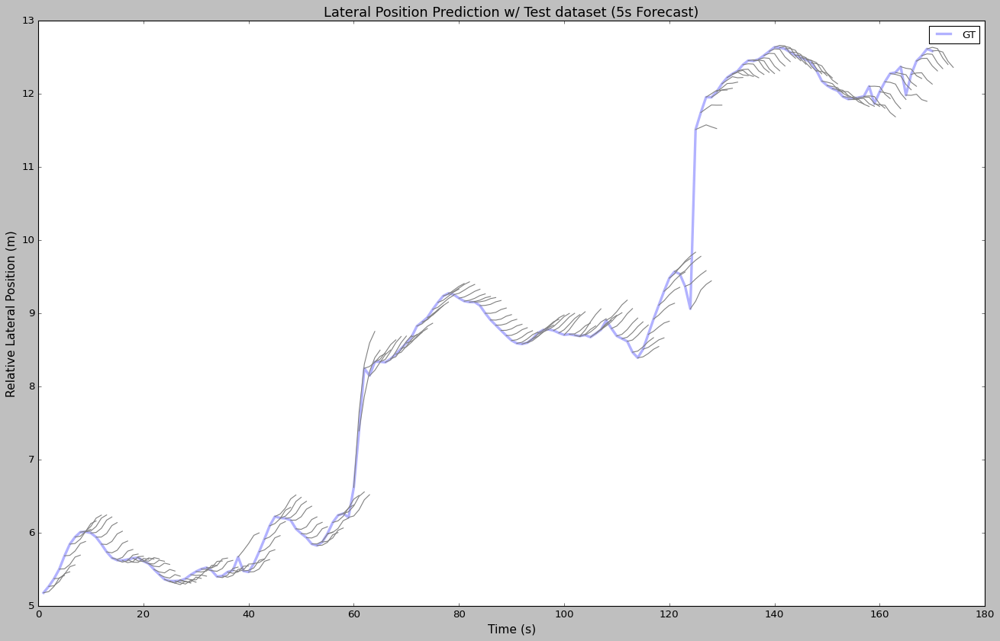

In [359]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_5_x_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
# plt.plot(range(10,180),testPredict_10_x_act[10200:10370,9]/3.28084,'green',label='Forecast = 10s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+5),testPredict_5_x_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction w/ Test dataset (5s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Relative Lateral Position (m)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

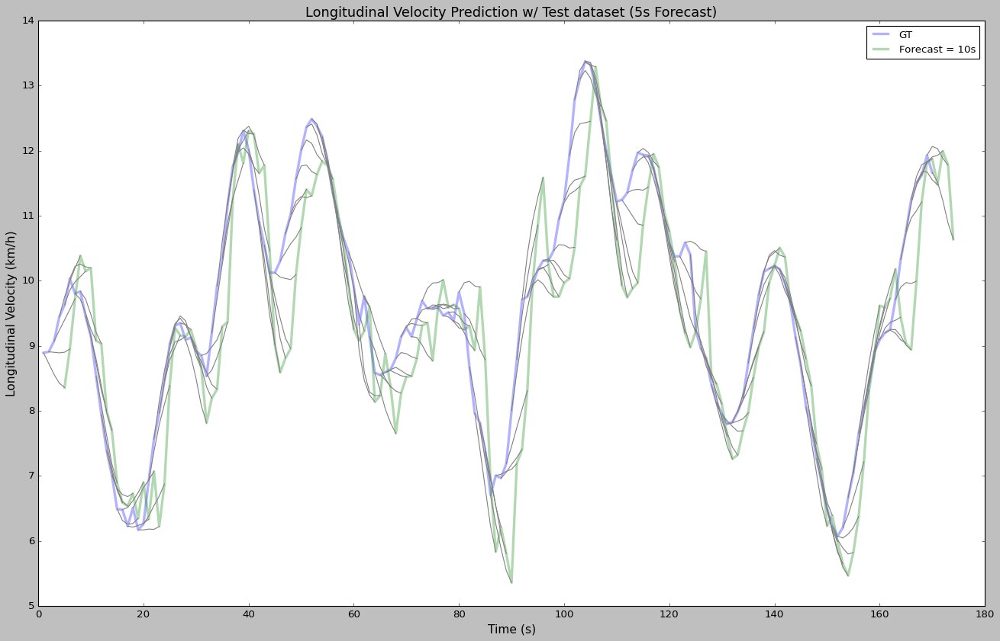

In [360]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_5_v_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
plt.plot(range(5,175),testPredict_5_v_act[10200:10370,4]/3.28084,'green',label='Forecast = 10s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+5),testPredict_5_v_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset (5s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

<function matplotlib.pyplot.show>

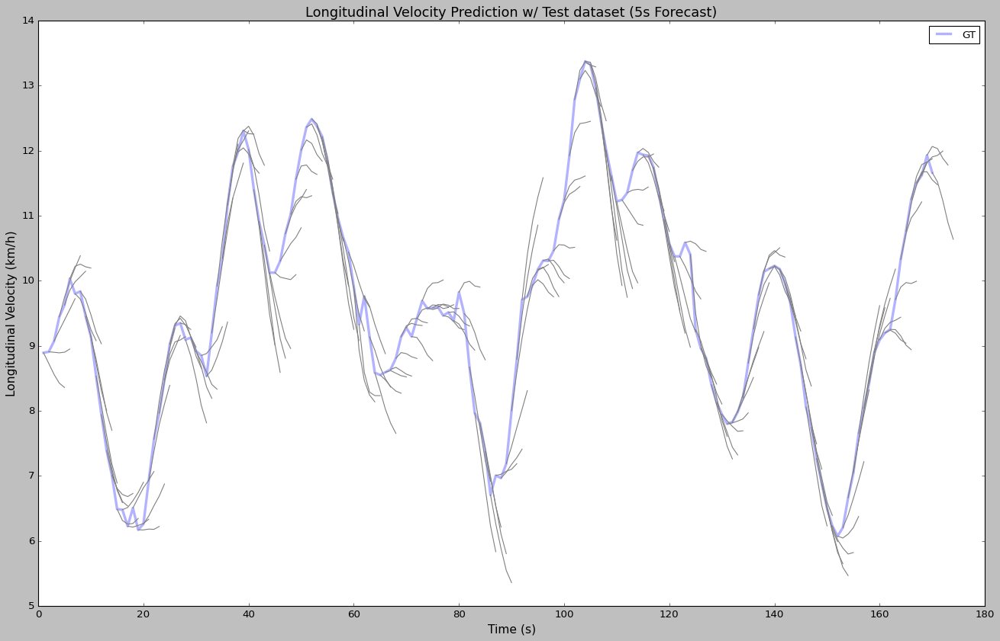

In [361]:
plt.figure(figsize=(20, 12))  
# plt.plot(range(1,171),y1_test_act[10200:10370,0]/3.28084,label='GT')
plt.plot(range(1,171),testPredict_5_v_act[10200:10370,0]/3.28084,'blue',label='GT',linewidth = 3, alpha=0.3)
# plt.plot(range(10,180),testPredict_10_v_act[10200:10370,9]/3.28084,'green',label='Forecast = 10s',linewidth = 3, alpha=0.3)
m = 1
for i in range(10200,10370):
  # plt.plot(y1_test_act[i][:]/3.28084)
  plt.plot(range(m,m+5),testPredict_5_v_act[i][:]/3.28084,'gray')
  m = m + 1
plt.legend(loc='best', fontsize='12')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction w/ Test dataset (5s Forecast)', fontsize='16')
plt.xlabel('Time (s)', fontsize='14')
plt.ylabel('Longitudinal Velocity (km/h)', fontsize='14')
plt.show

# **Error Bar (10s Forecast)**

---

<function matplotlib.pyplot.show>

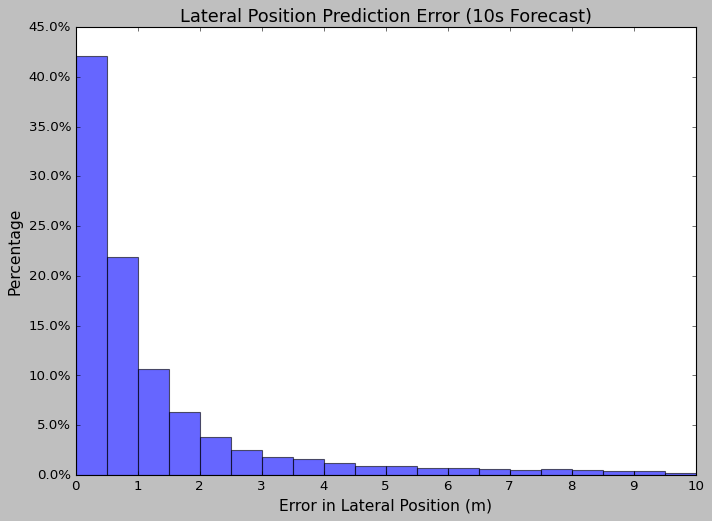

In [344]:
import matplotlib.ticker as mtick
error_x_10 = abs(y1_test_act[:,9]/3.28084-testPredict_10_x_act[:,9]/3.28084)

fig = plt.figure(figsize =(10, 7))
plt.hist(error_x_10, bins = np.linspace(0,10,21), color = "blue", alpha = 0.6, weights=np.ones(len(error_x_10)) / len(error_x_10))
plt.xlim([0,10])
plt.xticks(np.arange(11),fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction Error (10s Forecast)', fontsize='16')
plt.xlabel('Error in Lateral Position (m)', fontsize='14')
plt.ylabel('Percentage', fontsize='14')

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))
plt.style.use("classic")
plt.grid(False)
plt.show

<function matplotlib.pyplot.show>

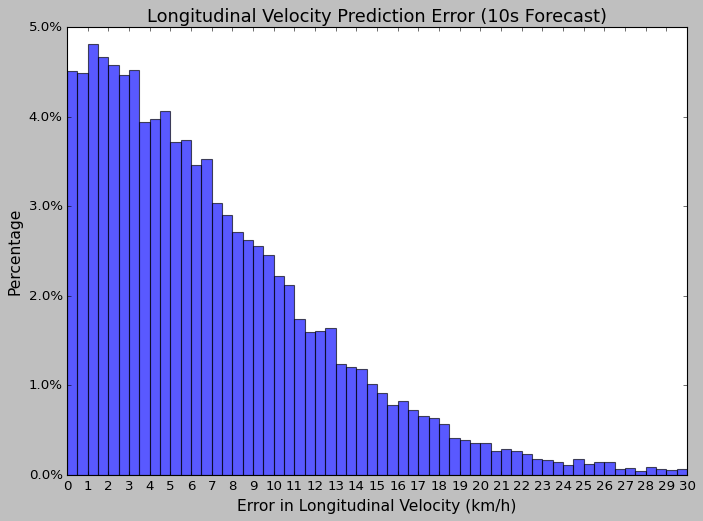

In [349]:
error_v_10 = abs(y2_test_act[:,9]*1.09728-testPredict_10_v_act[:,9]*1.09728)

# rms = mean_squared_error(y2_test_act[10200:10370,9]*1.09728, testPredict_10_v_act[10200:10370,9]*1.09728, squared=False)

# print(np.amax(error_x_all))

fig = plt.figure(figsize =(10, 7))
# plt.hist(error_v_all,density = True, bins = np.linspace(0,20,41),alpha = 0.65)
plt.hist(error_v_10, bins = np.linspace(0,30,61),alpha = 0.65, weights=np.ones(len(error_v_10)) / len(error_v_10))
# plt.xlim([0,10])
plt.xticks(np.arange(31),fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction Error (10s Forecast)', fontsize='16')
plt.xlabel('Error in Longitudinal Velocity (km/h)', fontsize='14')
plt.ylabel('Percentage', fontsize='14')

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))
plt.style.use("classic")
plt.grid(False)
plt.show

# **Error Bar (5s Forecast)**

---

<function matplotlib.pyplot.show>

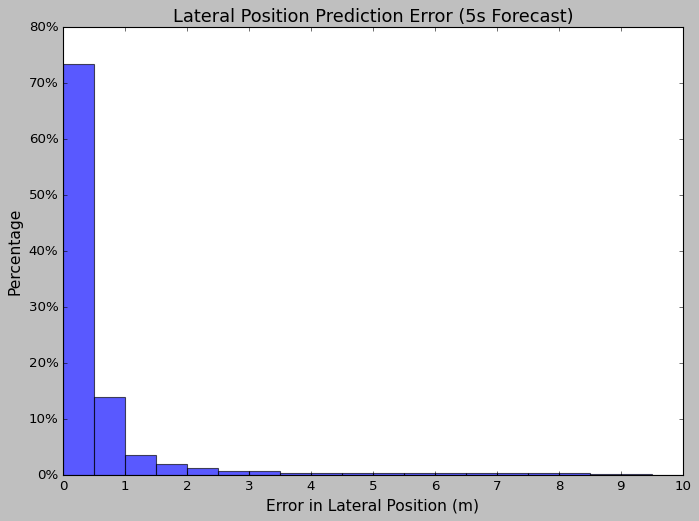

In [347]:
error_x_5 = abs(y1_test_act[:,4]/3.28084-testPredict_5_x_act[:30012,4]/3.28084)

fig = plt.figure(figsize =(10, 7))
plt.hist(error_x_5, bins = np.linspace(0,10,21),alpha = 0.65, weights=np.ones(len(error_x_5)) / len(error_x_5))
plt.xlim([0,10])
plt.xticks(np.arange(11),fontsize=12)
plt.yticks(fontsize=12)
plt.title('Lateral Position Prediction Error (5s Forecast)', fontsize='16')
plt.xlabel('Error in Lateral Position (m)', fontsize='14')
plt.ylabel('Percentage', fontsize='14')

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))
plt.style.use("classic")
plt.grid(False)
plt.show

<function matplotlib.pyplot.show>

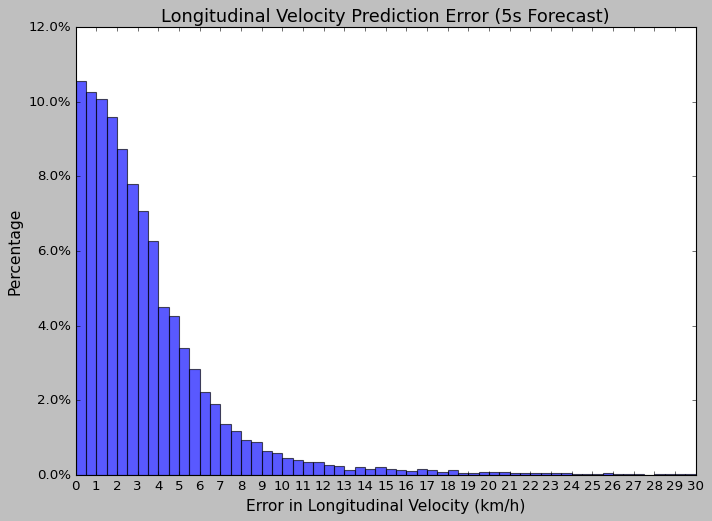

In [348]:
error_v_5 = abs(y2_test_act[:,4]*1.09728-testPredict_5_v_act[:30012,4]*1.09728)

# rms = mean_squared_error(y2_test_act[10200:10370,9]*1.09728, testPredict_10_v_act[10200:10370,9]*1.09728, squared=False)

# print(np.amax(error_x_all))

fig = plt.figure(figsize =(10, 7))
# plt.hist(error_v_all,density = True, bins = np.linspace(0,20,41),alpha = 0.65)
plt.hist(error_v_5, bins = np.linspace(0,30,61),alpha = 0.65, weights=np.ones(len(error_v_5)) / len(error_v_5))
# plt.xlim([0,10])
plt.xticks(np.arange(31),fontsize=12)
plt.yticks(fontsize=12)
plt.title('Longitudinal Velocity Prediction Error (5s Forecast)', fontsize='16')
plt.xlabel('Error in Longitudinal Velocity (km/h)', fontsize='14')
plt.ylabel('Percentage', fontsize='14')

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter(1))
plt.style.use("classic")
plt.grid(False)
plt.show